In [2]:
from ultralytics import YOLO

In [7]:
model = YOLO('../runs/content/runs/detect/train3/weights/best.pt')


image 1/1 c:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\0.jpg: 640x480 1 tab, 273.6ms
Speed: 7.6ms preprocess, 273.6ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


In [12]:
import matplotlib.pyplot as plt

results[0].plot()
plt.show()

In [13]:
results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'tab'}
 obb: None
 orig_img: array([[[192, 162,   3],
         [188, 158,   0],
         [183, 152,   0],
         ...,
         [227, 197,  24],
         [222, 192,  21],
         [223, 194,  26]],
 
        [[186, 156,   0],
         [189, 159,   0],
         [190, 160,   1],
         ...,
         [226, 196,  23],
         [224, 194,  23],
         [228, 196,  29]],
 
        [[202, 173,  12],
         [192, 163,   2],
         [192, 162,   3],
         ...,
         [215, 183,  10],
         [209, 179,   8],
         [196, 164,   0]],
 
        ...,
 
        [[182, 175, 132],
         [162, 155, 112],
         [152, 146, 101],
         ...,
         [159, 156, 125],
         [175, 172, 141],
         [174, 171, 140]],
 
        [[143, 134,  91],
         [148, 139,  96],
         [153, 144, 100],
         ...,
         [154, 151, 1

In [14]:
results[0].boxes

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.])
conf: tensor([0.8962])
data: tensor([[1.2501e+02, 6.5590e+02, 8.7436e+02, 9.7087e+02, 8.9622e-01, 0.0000e+00]])
id: None
is_track: False
orig_shape: (1500, 1125)
shape: torch.Size([1, 6])
xywh: tensor([[499.6890, 813.3832, 749.3517, 314.9703]])
xywhn: tensor([[0.4442, 0.5423, 0.6661, 0.2100]])
xyxy: tensor([[125.0132, 655.8981, 874.3649, 970.8683]])
xyxyn: tensor([[0.1111, 0.4373, 0.7772, 0.6472]])

In [15]:
for result in results:
    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Bounding box coordinates
        confidence = box.conf[0]                # Confidence score
        class_id = int(box.cls[0])              # Class ID
        class_name = model.names[class_id]      # Class name

        print(f"Class: {class_name}, Confidence: {confidence:.2f}")
        print(f"Coordinates: ({x1}, {y1}) to ({x2}, {y2})")


Class: tab, Confidence: 0.90
Coordinates: (125, 655) to (874, 970)


In [16]:
import cv2

In [ ]:


#resized = cv2.resize(image, (640, 640))

In [39]:
image_path = 'images/test/13.jpg'
results = model.predict(source=image_path, save=True, conf=0.5)


image 1/1 c:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\13.jpg: 640x480 1 tab, 175.1ms
Speed: 4.0ms preprocess, 175.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


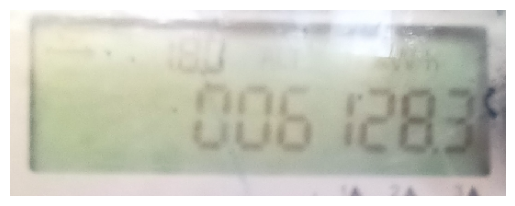

In [40]:
image_path = 'C:/Users/Sasa/Downloads/windows_v1.8.1/windows_v1.8.1/data/images/test/13.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Loop through the results and crop the region of interest
for result in results:
    for box in result.boxes:
        # Get bounding box coordinates: [x1, y1, x2, y2]
        x1, y1, x2, y2 = map(int, box.xyxy[0])

        # Crop the image using the bounding box coordinates
        cropped_image = image[y1:y2, x1:x2]

        cropped_image_rgb = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)

        # Display the cropped image
        plt.imshow(cropped_image_rgb)
        plt.axis('off')
        plt.show()

In [41]:
data_yml = 'C:/Users/Sasa/Downloads/windows_v1.8.1/windows_v1.8.1/data/electric_meter.yaml'

In [42]:
results_val = model.val(data=data_yml, imgsz=640)

Ultralytics 8.3.29  Python-3.9.20 torch-2.5.1+cpu CPU (Intel Core(TM) i7-5500U 2.40GHz)


val: Scanning C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\labels\val.cache... 58 images, 0 backgrounds, 0 corrupt: 100%|██████████| 58/58 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:11<00:00,  2.99s/it]


                   all         58         58      0.982      0.925      0.944      0.779
Speed: 3.4ms preprocess, 143.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs\detect\val


In [45]:
results_val

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001E3287B2E80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [47]:
import pandas as pd

df = pd.read_csv('C:/Users/Sasa/Downloads/windows_v1.8.1/windows_v1.8.1/data/runs/content/runs/detect/train3/results.csv')

In [48]:
df.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,18.2061,1.35184,3.55336,1.40056,0.00785,0.87931,0.44704,0.29060,0.91153,3.04138,1.04280,0.000240,0.000240,0.000240
1,2,27.7651,0.97959,1.96804,1.05647,0.95251,0.34589,0.58181,0.41584,0.86308,2.97867,0.99274,0.000490,0.000490,0.000490
2,3,34.6967,0.97439,1.66670,1.04167,1.00000,0.28436,0.57931,0.42707,0.90741,2.94484,1.02084,0.000730,0.000730,0.000730
3,4,45.1295,0.99430,1.57758,1.06894,0.88498,0.27586,0.46137,0.32130,1.05800,2.99978,1.12203,0.000959,0.000959,0.000959
4,5,52.3005,0.91664,1.38532,1.02899,0.92581,0.29310,0.49154,0.35615,1.14415,3.00104,1.15580,0.001179,0.001179,0.001179


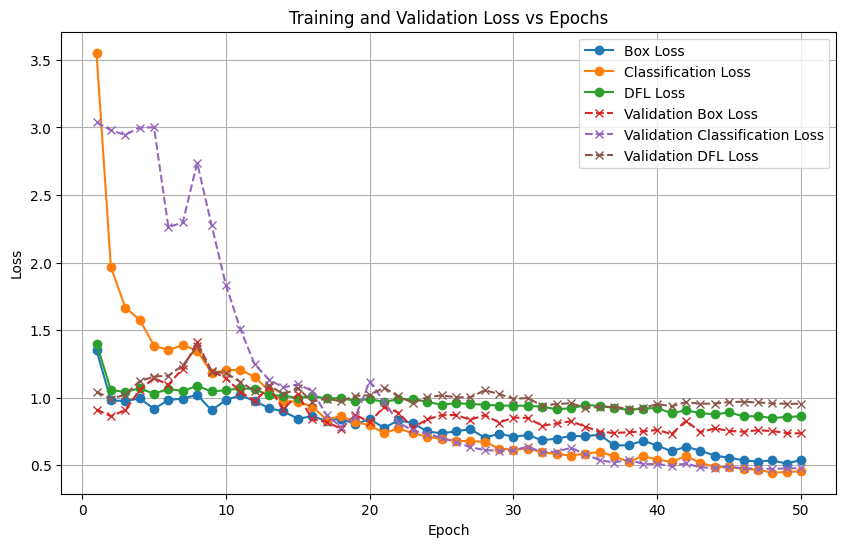

In [49]:
import matplotlib.pyplot as plt
%matplotlib inline

# Plotting Loss vs. Epoch
plt.figure(figsize=(10, 6))

# Plot Training Losses
plt.plot(df['epoch'], df['train/box_loss'], label='Box Loss', marker='o')
plt.plot(df['epoch'], df['train/cls_loss'], label='Classification Loss', marker='o')
plt.plot(df['epoch'], df['train/dfl_loss'], label='DFL Loss', marker='o')

# Plot Validation Losses
plt.plot(df['epoch'], df['val/box_loss'], label='Validation Box Loss', linestyle='--', marker='x')
plt.plot(df['epoch'], df['val/cls_loss'], label='Validation Classification Loss', linestyle='--', marker='x')
plt.plot(df['epoch'], df['val/dfl_loss'], label='Validation DFL Loss', linestyle='--', marker='x')

# Labels and Legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss vs Epochs')
plt.legend()
plt.grid()
plt.show()


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\0.jpg: 640x480 1 tab, 409.0ms
Speed: 8.6ms preprocess, 409.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


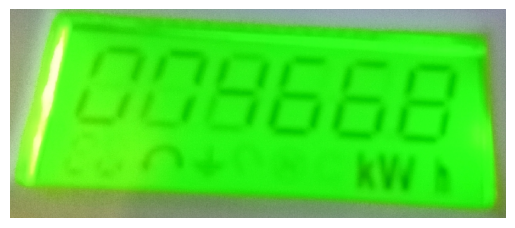


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\104.jpg: 640x480 1 tab, 214.9ms
Speed: 5.0ms preprocess, 214.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


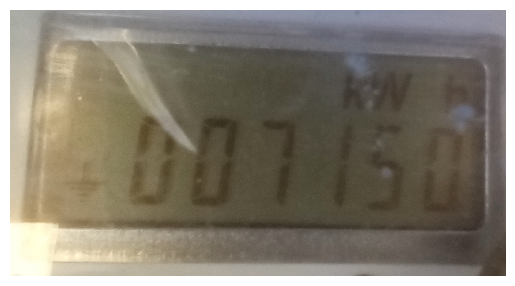


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\120.jpg: 640x480 1 tab, 307.9ms
Speed: 10.3ms preprocess, 307.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


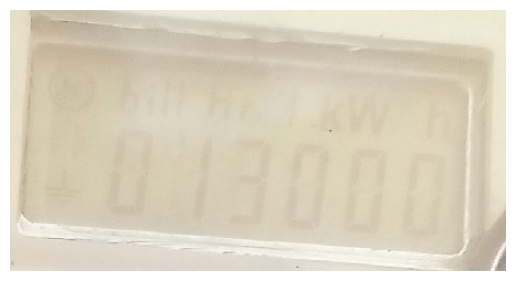


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\13.jpg: 640x480 1 tab, 230.8ms
Speed: 7.0ms preprocess, 230.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


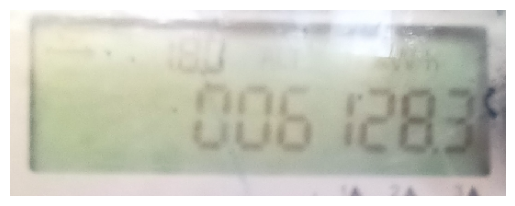


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\131.jpg: 640x480 1 tab, 226.5ms
Speed: 4.4ms preprocess, 226.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


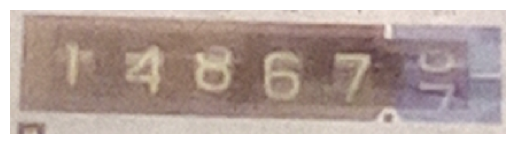


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\135.jpg: 640x480 1 tab, 313.6ms
Speed: 55.0ms preprocess, 313.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


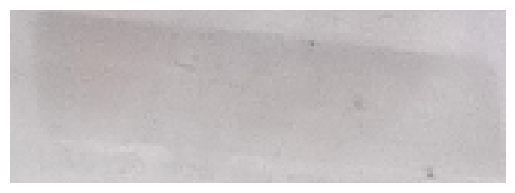


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\147.jpg: 640x480 1 tab, 189.5ms
Speed: 8.0ms preprocess, 189.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


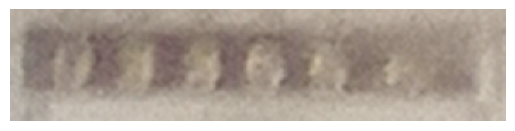


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\150.jpg: 640x480 (no detections), 168.2ms
Speed: 5.0ms preprocess, 168.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict

image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\190.jpg: 640x480 1 tab, 220.4ms
Speed: 4.0ms preprocess, 220.4ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


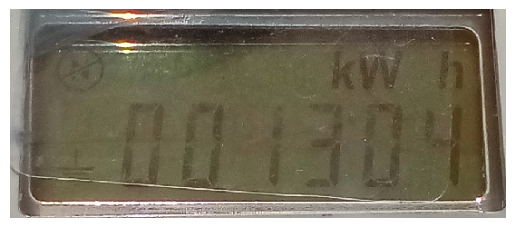


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\209.jpg: 640x480 1 tab, 173.8ms
Speed: 7.0ms preprocess, 173.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


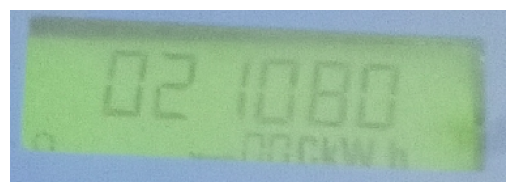


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\21.jpg: 640x480 1 tab, 388.1ms
Speed: 63.4ms preprocess, 388.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


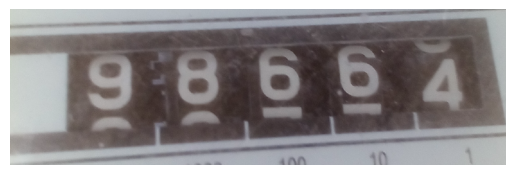


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\212.jpg: 640x480 1 tab, 244.9ms
Speed: 11.0ms preprocess, 244.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


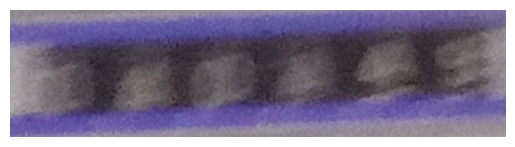


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\23.jpg: 640x480 1 tab, 184.6ms
Speed: 6.0ms preprocess, 184.6ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


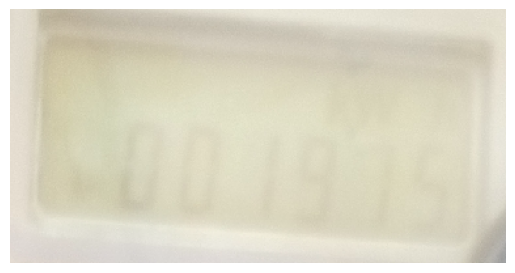


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\231.jpg: 640x480 1 tab, 263.2ms
Speed: 9.0ms preprocess, 263.2ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


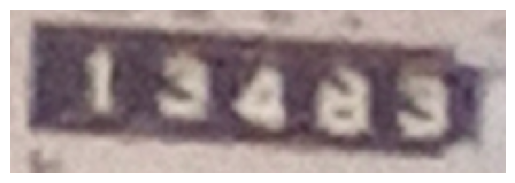


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\238.jpg: 640x480 1 tab, 274.2ms
Speed: 36.0ms preprocess, 274.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


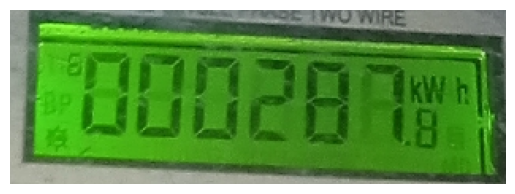


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\239.jpg: 640x480 1 tab, 179.8ms
Speed: 7.0ms preprocess, 179.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


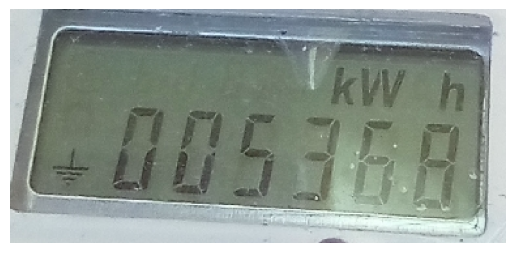


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\25.jpg: 640x480 (no detections), 199.0ms
Speed: 11.0ms preprocess, 199.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict

image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\255.jpg: 640x480 1 tab, 214.4ms
Speed: 10.0ms preprocess, 214.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


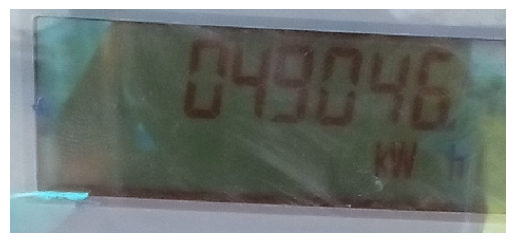


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\265.jpg: 640x480 1 tab, 226.0ms
Speed: 35.8ms preprocess, 226.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


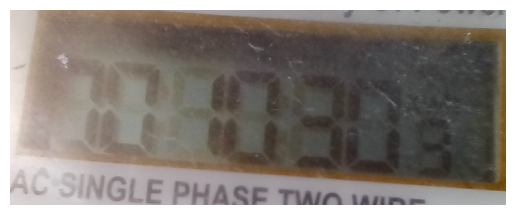


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\269.jpg: 640x480 1 tab, 176.7ms
Speed: 8.0ms preprocess, 176.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


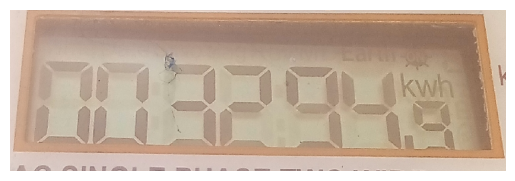


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\279.jpg: 640x480 1 tab, 337.5ms
Speed: 35.6ms preprocess, 337.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


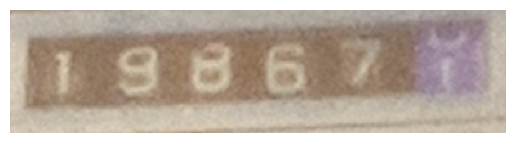


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\29.jpg: 640x480 2 tabs, 438.4ms
Speed: 46.0ms preprocess, 438.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


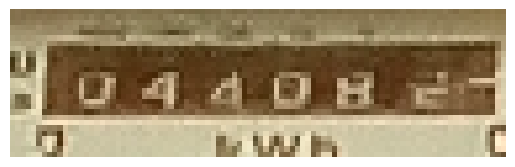

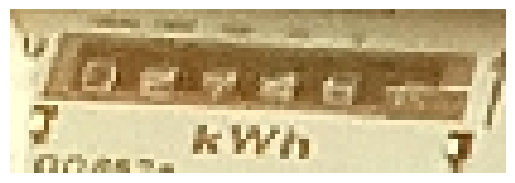


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\295.jpg: 640x480 1 tab, 244.0ms
Speed: 13.0ms preprocess, 244.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


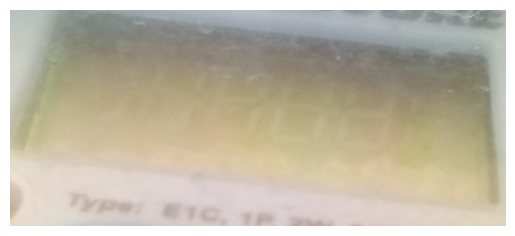


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\33.jpg: 640x480 1 tab, 318.1ms
Speed: 26.0ms preprocess, 318.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


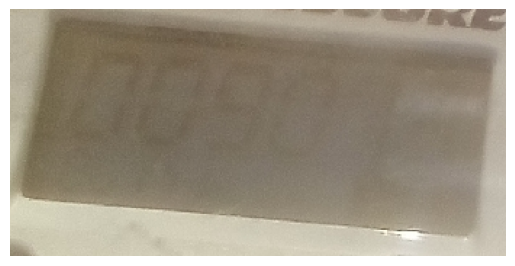


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\44.jpg: 640x480 1 tab, 318.6ms
Speed: 18.0ms preprocess, 318.6ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


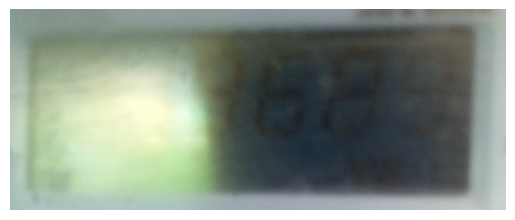


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\53.jpg: 640x480 1 tab, 256.7ms
Speed: 18.6ms preprocess, 256.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


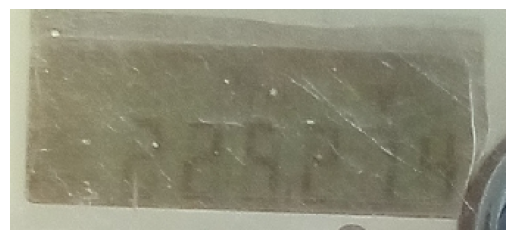


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\6.jpg: 640x480 (no detections), 245.9ms
Speed: 50.3ms preprocess, 245.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict

image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\73.jpg: 640x480 1 tab, 231.4ms
Speed: 5.0ms preprocess, 231.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


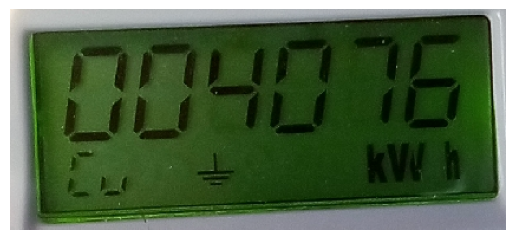


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\75.jpg: 640x480 1 tab, 194.4ms
Speed: 8.0ms preprocess, 194.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


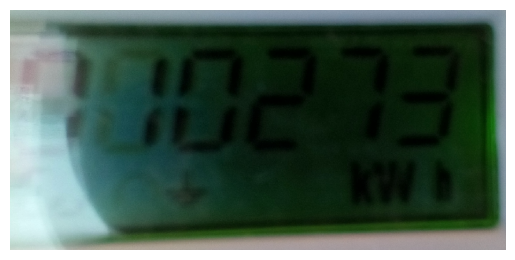


image 1/1 C:\Users\Sasa\Downloads\windows_v1.8.1\windows_v1.8.1\data\images\test\93.jpg: 640x480 1 tab, 393.4ms
Speed: 11.0ms preprocess, 393.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict


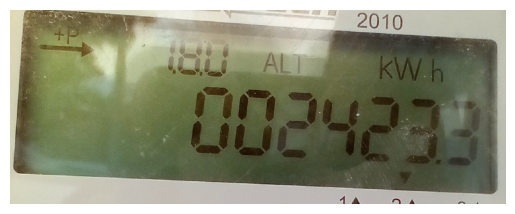

In [ ]:
import os

# Make the cropped images directory if it doesnt exist
cropped_images_dir = 'cropped_images'
if not os.path.exists(cropped_images_dir):
    os.makedirs(cropped_images_dir)


# Define the path to the directory containing the images
images_dir = 'C:/Users/Sasa/Downloads/windows_v1.8.1/windows_v1.8.1/data/images/test'

# Get the list of image files in the directory
image_files = os.listdir(images_dir)

# Do the prediction on each image file
for image_file in image_files:
    # Get the full path to the image file
    image_path = os.path.join(images_dir, image_file)

    # Perform the prediction
    results = model.predict(source=image_path, save=True, conf=0.5)

    # Load the image using OpenCV
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Loop through the results and crop the region of interest
    for result in results:
        for box in result.boxes:
            # Get bounding box coordinates: [x1, y1, x2, y2]
            x1, y1, x2, y2 = map(int, box.xyxy[0])

            # Crop the image using the bounding box coordinates
            cropped_image = image[y1:y2, x1:x2]

            cropped_image_rgb = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)

            # Display the cropped image
            plt.imshow(cropped_image_rgb)
            plt.axis('off')
            plt.show()

In [ ]:
from paddleocr import PaddleOCR, draw_ocr

In [3]:
ocr = PaddleOCR(use_angle_cls=True, lang='en') # need to run only once to download and load model into memory

[2024/11/13 13:08:17] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\Sasa/.paddleocr/whl\\det\\en\\en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\Sasa/.paddleocr/whl\\rec\\en\\en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6,

In [12]:
img_path = 'C:/Users/Sasa/Desktop/data/cropped_dir/cropped_11.jpg'
result = ocr.ocr(img_path, cls=True)
for idx in range(len(result)):
    res = result[idx]
    for line in res:
        print(line)

[2024/11/13 13:14:59] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.1254439353942871
[2024/11/13 13:14:59] ppocr DEBUG: cls num  : 2, elapsed : 0.024682283401489258
[2024/11/13 13:15:00] ppocr DEBUG: rec_res num  : 2, elapsed : 0.9721119403839111
[[[284.0, 35.0], [409.0, 40.0], [408.0, 85.0], [282.0, 80.0]], ('kW h', 0.8486347198486328)]
[[[100.0, 82.0], [402.0, 91.0], [399.0, 172.0], [98.0, 162.0]], ('002995', 0.9840589165687561)]


In [ ]:
# draw result
import cv2
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
boxes = [line[0] for line in result[0]]
txts = [line[1][0] for line in result[0]]
scores = [line[1][1] for line in result[0]]
im_show = draw_ocr(image, boxes, txts, scores, font_path='C:/Users/Sasa/Desktop/data/PaddleOCR/doc/fonts/latin.ttf')
im_show = Image.fromarray(im_show)


In [15]:
im_show.show()

In [18]:
import pandas as pd 

df = pd.read_csv('./Readings1.csv')
df['Value'] = df['Value'].astype(str)
df['Matched'] = False

In [19]:
df.head()

,URL,Value,Matched
0,https://subs-production.s3.us-west-2.amazonaws...,6345,False
1,https://subs-production.s3.us-west-2.amazonaws...,5926,False
2,https://subs-production.s3.us-west-2.amazonaws...,4978,False
3,https://subs-production.s3.us-west-2.amazonaws...,2455,False
4,https://subs-production.s3.us-west-2.amazonaws...,533,False


In [32]:
# Load and preprocess image
def load_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if image is None:
        raise ValueError(f"Unable to load image: {image_path}")
    return image

In [33]:
# Perform OCR and return the results
def perform_ocr(image):
    ocr_results = ocr.ocr(image, cls=True)
    
    if not ocr_results or not ocr_results[0]:
        return [], [], []
    
    # Extract bounding boxes, text, and confidence scores
    boxes = [line[0] for line in ocr_results[0]]
    texts = [line[1][0] for line in ocr_results[0]]
    scores = [line[1][1] for line in ocr_results[0]]
    return boxes, texts, scores

In [34]:
# Check for text match and update the DataFrame
def check_and_update_match(texts, value_to_match):
    for text in texts:
        if value_to_match.lower() in text.lower():
            return True
    return False

In [39]:
import numpy as np

# Draw bounding boxes for matched text
def draw_matched_text(font, original_image, boxes, texts, scores, value_to_match):
    matched_boxes, matched_texts, matched_scores = [], [], []
    for i, text in enumerate(texts):
        if value_to_match.lower() in text.lower():
            matched_boxes.append(boxes[i])
            matched_texts.append(text)
            matched_scores.append(scores[i])
            break

    # Draw the bounding boxes on the original image
    image_with_matched_ocr = draw_ocr(
        Image.fromarray(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)),
        matched_boxes,
        matched_texts,
        matched_scores,
        font_path=font
    )
    return cv2.cvtColor(np.array(image_with_matched_ocr), cv2.COLOR_RGB2BGR)

In [40]:
# Main function to process images in the folder
def process_images(folder_path, font_path, csv_file):
    df = pd.read_csv(csv_file)
    df['Value'] = df['Value'].astype(str)
    df['Matched'] = False

    # Iterate through image files in the folder
    for filename in os.listdir(folder_path):
        if not filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            continue

        print(f"\nProcessing {filename}...")
        try:
            filename_index = int(filename.split('_')[1].split('.')[0])
        except (IndexError, ValueError):
            print(f"Invalid filename format for {filename}. Skipping...")
            continue

        if filename_index >= len(df):
            print(f"Index {filename_index} out of range in CSV. Skipping...")
            continue

        value_to_match = df.loc[filename_index, 'Value']

        # Load and preprocess the image
        image = load_image(os.path.join(folder_path, filename))

        # Perform OCR
        boxes, texts, scores = perform_ocr(image)

        if not texts:
            print(f"No text detected in {filename}. Skipping...")
            continue

        # Update DataFrame if match is found
        if check_and_update_match(texts, value_to_match):
            df.at[filename_index, 'Matched'] = True
            print(f"Match found for '{value_to_match}' in {filename}.")

        # Draw the matched text
        processed_image = draw_matched_text(font_path, image, boxes, texts, scores, value_to_match)

        # Display the processed image
        plt.imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

    # Optionally save the updated CSV
    output_csv_path = os.path.join(os.path.dirname(csv_file), 'Updated_Readings3.csv')
    df.to_csv(output_csv_path, index=False)
    print(f"\nUpdated CSV saved to: {output_csv_path}")
    return output_csv_path

In [41]:
def check_accuracy(csv_file):
    df = pd.read_csv(csv_file)
    total = len(df)
    matched = len(df[df['Matched'] == True])
    accuracy = (matched / total) * 100
    print(f"\nTotal images: {total}")
    print(f"Matched images: {matched}")
    print(f"Accuracy: {accuracy:.2f}%")


Processing cropped_0.jpg...
[2024/11/13 13:31:59] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.07381653785705566
[2024/11/13 13:31:59] ppocr DEBUG: cls num  : 1, elapsed : 0.020987510681152344
[2024/11/13 13:31:59] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3304750919342041
Match found for '6345' in cropped_0.jpg.


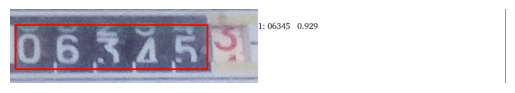


Processing cropped_1.jpg...
[2024/11/13 13:32:00] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.44039320945739746
[2024/11/13 13:32:00] ppocr DEBUG: cls num  : 2, elapsed : 0.04973006248474121
[2024/11/13 13:32:01] ppocr DEBUG: rec_res num  : 2, elapsed : 1.5607080459594727
Match found for '5926' in cropped_1.jpg.


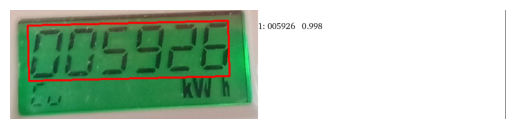


Processing cropped_10.jpg...
[2024/11/13 13:32:02] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.7323815822601318
[2024/11/13 13:32:02] ppocr DEBUG: cls num  : 2, elapsed : 0.06098628044128418
[2024/11/13 13:32:03] ppocr DEBUG: rec_res num  : 2, elapsed : 1.1299240589141846
Match found for '7751' in cropped_10.jpg.


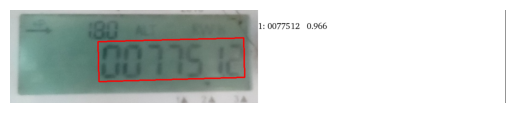


Processing cropped_100.jpg...
[2024/11/13 13:32:04] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.5468695163726807
[2024/11/13 13:32:04] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:32:04] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_100.jpg. Skipping...

Processing cropped_101.jpg...
[2024/11/13 13:32:05] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.36186981201171875
[2024/11/13 13:32:05] ppocr DEBUG: cls num  : 2, elapsed : 0.02404046058654785
[2024/11/13 13:32:06] ppocr DEBUG: rec_res num  : 2, elapsed : 0.9920952320098877
Match found for '6548' in cropped_101.jpg.


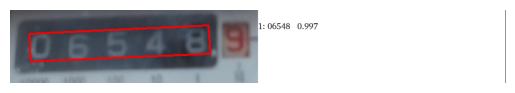


Processing cropped_102.jpg...
[2024/11/13 13:32:06] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.10456967353820801
[2024/11/13 13:32:06] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:32:06] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_102.jpg. Skipping...

Processing cropped_103.jpg...
[2024/11/13 13:32:06] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.40962648391723633
[2024/11/13 13:32:06] ppocr DEBUG: cls num  : 1, elapsed : 0.019986867904663086
[2024/11/13 13:32:07] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3078901767730713
No text detected in cropped_103.jpg. Skipping...

Processing cropped_104.jpg...
[2024/11/13 13:32:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.35658931732177734
[2024/11/13 13:32:07] ppocr DEBUG: cls num  : 1, elapsed : 0.05439186096191406
[2024/11/13 13:32:07] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3267028331756592
No text detected in cropped_104.jpg. Skipping...

Processing cropped_105.jpg...
[2024/11/13 13:32:07] ppocr D

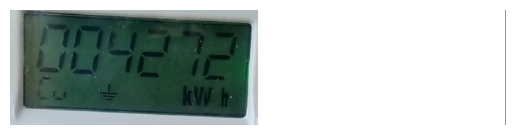


Processing cropped_106.jpg...
[2024/11/13 13:32:10] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.5026617050170898
[2024/11/13 13:32:10] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:32:10] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_106.jpg. Skipping...

Processing cropped_107.jpg...
[2024/11/13 13:32:11] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.31994152069091797
[2024/11/13 13:32:11] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:32:11] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_107.jpg. Skipping...

Processing cropped_108.jpg...
[2024/11/13 13:32:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.09394717216491699
[2024/11/13 13:32:11] ppocr DEBUG: cls num  : 1, elapsed : 0.1172933578491211
[2024/11/13 13:32:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4787442684173584
Match found for '685' in cropped_108.jpg.


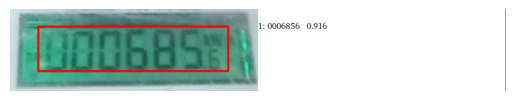


Processing cropped_109.jpg...
[2024/11/13 13:32:12] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.39812397956848145
[2024/11/13 13:32:12] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:32:12] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_109.jpg. Skipping...

Processing cropped_11.jpg...
[2024/11/13 13:32:12] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.5016403198242188
[2024/11/13 13:32:12] ppocr DEBUG: cls num  : 2, elapsed : 0.12624096870422363
[2024/11/13 13:32:14] ppocr DEBUG: rec_res num  : 2, elapsed : 1.192204475402832
Match found for '2995' in cropped_11.jpg.


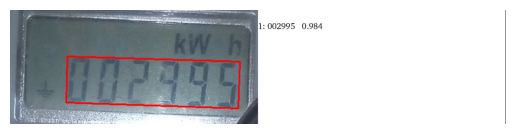


Processing cropped_110.jpg...
[2024/11/13 13:32:15] ppocr DEBUG: dt_boxes num : 5, elapsed : 0.585437536239624
[2024/11/13 13:32:15] ppocr DEBUG: cls num  : 5, elapsed : 0.15175604820251465
[2024/11/13 13:32:18] ppocr DEBUG: rec_res num  : 5, elapsed : 3.3105483055114746
Match found for '5469' in cropped_110.jpg.


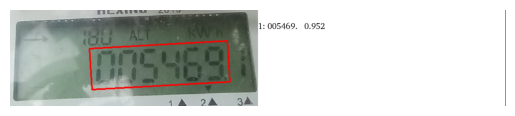


Processing cropped_112.jpg...
[2024/11/13 13:32:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5039446353912354
[2024/11/13 13:32:19] ppocr DEBUG: cls num  : 1, elapsed : 0.024410009384155273
[2024/11/13 13:32:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.36359572410583496
Match found for '5832' in cropped_112.jpg.


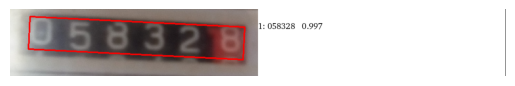


Processing cropped_113.jpg...
[2024/11/13 13:32:20] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.5525293350219727
[2024/11/13 13:32:20] ppocr DEBUG: cls num  : 2, elapsed : 0.02761363983154297
[2024/11/13 13:32:21] ppocr DEBUG: rec_res num  : 2, elapsed : 1.0958218574523926
Match found for '4083' in cropped_113.jpg.


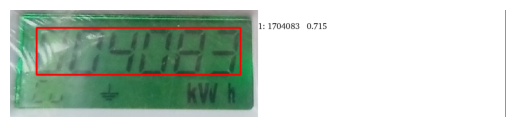


Processing cropped_114.jpg...
[2024/11/13 13:32:22] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.23435211181640625
[2024/11/13 13:32:22] ppocr DEBUG: cls num  : 2, elapsed : 0.03188514709472656
[2024/11/13 13:32:23] ppocr DEBUG: rec_res num  : 2, elapsed : 0.9349939823150635
Match found for '22530' in cropped_114.jpg.


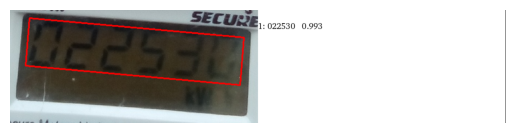


Processing cropped_115.jpg...
[2024/11/13 13:32:24] ppocr DEBUG: dt_boxes num : 7, elapsed : 0.9155242443084717
[2024/11/13 13:32:24] ppocr DEBUG: cls num  : 7, elapsed : 0.28173255920410156
[2024/11/13 13:32:28] ppocr DEBUG: rec_res num  : 7, elapsed : 3.753979444503784


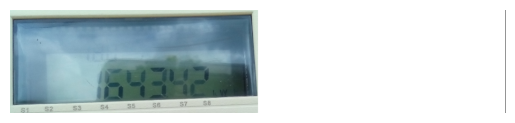


Processing cropped_116.jpg...
[2024/11/13 13:32:28] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.3613710403442383
[2024/11/13 13:32:28] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:32:28] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_116.jpg. Skipping...

Processing cropped_117.jpg...
[2024/11/13 13:32:28] ppocr DEBUG: dt_boxes num : 9, elapsed : 0.2541971206665039
[2024/11/13 13:32:29] ppocr DEBUG: cls num  : 9, elapsed : 0.17425990104675293
[2024/11/13 13:32:34] ppocr DEBUG: rec_res num  : 9, elapsed : 4.95094633102417


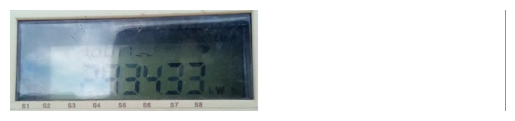


Processing cropped_118.jpg...
[2024/11/13 13:32:35] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.884596586227417
[2024/11/13 13:32:35] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:32:35] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_118.jpg. Skipping...

Processing cropped_119.jpg...
[2024/11/13 13:32:35] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.4200918674468994
[2024/11/13 13:32:35] ppocr DEBUG: cls num  : 2, elapsed : 0.13242816925048828
[2024/11/13 13:32:36] ppocr DEBUG: rec_res num  : 2, elapsed : 1.1516482830047607
Match found for '5363' in cropped_119.jpg.


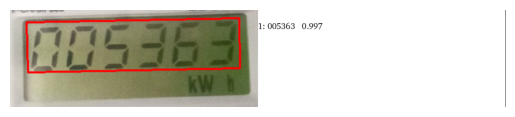


Processing cropped_12.jpg...
[2024/11/13 13:32:37] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.42336511611938477
[2024/11/13 13:32:37] ppocr DEBUG: cls num  : 1, elapsed : 0.13268637657165527
[2024/11/13 13:32:38] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5233962535858154
Match found for '3950' in cropped_12.jpg.


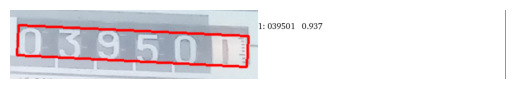


Processing cropped_120.jpg...
[2024/11/13 13:32:38] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.4963984489440918
[2024/11/13 13:32:38] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:32:38] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_120.jpg. Skipping...

Processing cropped_121.jpg...
[2024/11/13 13:32:39] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.3340742588043213
[2024/11/13 13:32:39] ppocr DEBUG: cls num  : 1, elapsed : 0.01859259605407715
[2024/11/13 13:32:39] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5326805114746094
Match found for '2411' in cropped_121.jpg.


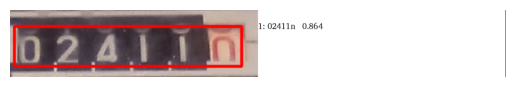


Processing cropped_122.jpg...
[2024/11/13 13:32:40] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.07177615165710449
[2024/11/13 13:32:40] ppocr DEBUG: cls num  : 1, elapsed : 0.020663738250732422
[2024/11/13 13:32:40] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3120591640472412
Match found for '1019' in cropped_122.jpg.


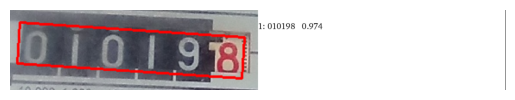


Processing cropped_124.jpg...
[2024/11/13 13:32:41] ppocr DEBUG: dt_boxes num : 5, elapsed : 0.9485323429107666
[2024/11/13 13:32:41] ppocr DEBUG: cls num  : 5, elapsed : 0.1444847583770752
[2024/11/13 13:32:44] ppocr DEBUG: rec_res num  : 5, elapsed : 3.225733757019043
Match found for '4533' in cropped_124.jpg.


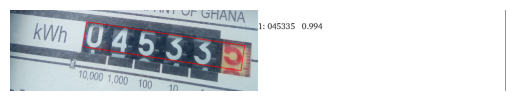


Processing cropped_125.jpg...
[2024/11/13 13:32:45] ppocr DEBUG: dt_boxes num : 4, elapsed : 0.7236571311950684
[2024/11/13 13:32:45] ppocr DEBUG: cls num  : 4, elapsed : 0.26850199699401855
[2024/11/13 13:32:48] ppocr DEBUG: rec_res num  : 4, elapsed : 2.376638650894165
Match found for '4557' in cropped_125.jpg.


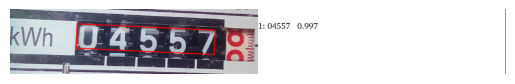


Processing cropped_126.jpg...
[2024/11/13 13:32:49] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.6710715293884277
[2024/11/13 13:32:49] ppocr DEBUG: cls num  : 2, elapsed : 0.12693095207214355
[2024/11/13 13:32:50] ppocr DEBUG: rec_res num  : 2, elapsed : 1.6896467208862305


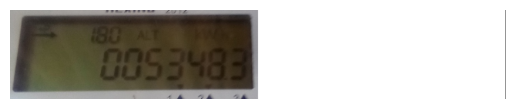


Processing cropped_127.jpg...
[2024/11/13 13:32:51] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.24983453750610352
[2024/11/13 13:32:51] ppocr DEBUG: cls num  : 1, elapsed : 0.12383627891540527
[2024/11/13 13:32:51] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5215606689453125
No text detected in cropped_127.jpg. Skipping...

Processing cropped_128.jpg...
[2024/11/13 13:32:52] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.5054607391357422
[2024/11/13 13:32:52] ppocr DEBUG: cls num  : 3, elapsed : 0.14783000946044922
[2024/11/13 13:32:54] ppocr DEBUG: rec_res num  : 3, elapsed : 1.9112365245819092


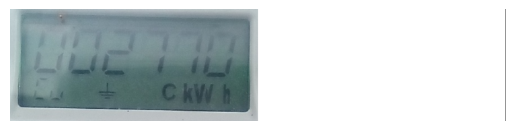


Processing cropped_129.jpg...
[2024/11/13 13:32:55] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.40463829040527344
[2024/11/13 13:32:55] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:32:55] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_129.jpg. Skipping...

Processing cropped_13.jpg...
[2024/11/13 13:32:55] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.5926516056060791
[2024/11/13 13:32:55] ppocr DEBUG: cls num  : 2, elapsed : 0.02398538589477539
[2024/11/13 13:32:56] ppocr DEBUG: rec_res num  : 2, elapsed : 1.01186203956604
Match found for '15052' in cropped_13.jpg.


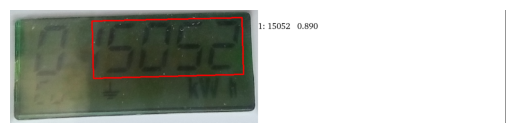


Processing cropped_130.jpg...
[2024/11/13 13:32:57] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.6112768650054932
[2024/11/13 13:32:57] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:32:57] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_130.jpg. Skipping...

Processing cropped_131.jpg...
[2024/11/13 13:32:57] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.41974806785583496
[2024/11/13 13:32:57] ppocr DEBUG: cls num  : 3, elapsed : 0.03314399719238281
[2024/11/13 13:32:59] ppocr DEBUG: rec_res num  : 3, elapsed : 1.9003605842590332


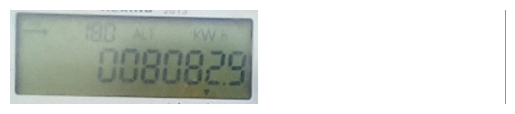


Processing cropped_132.jpg...
[2024/11/13 13:33:00] ppocr DEBUG: dt_boxes num : 5, elapsed : 0.6068296432495117
[2024/11/13 13:33:00] ppocr DEBUG: cls num  : 5, elapsed : 0.14058136940002441
[2024/11/13 13:33:03] ppocr DEBUG: rec_res num  : 5, elapsed : 2.7960009574890137
Match found for '2082' in cropped_132.jpg.


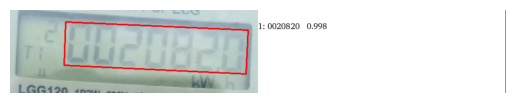


Processing cropped_133.jpg...
[2024/11/13 13:33:04] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.43083906173706055
[2024/11/13 13:33:04] ppocr DEBUG: cls num  : 3, elapsed : 0.036960601806640625
[2024/11/13 13:33:06] ppocr DEBUG: rec_res num  : 3, elapsed : 2.0625081062316895
Match found for '8536' in cropped_133.jpg.


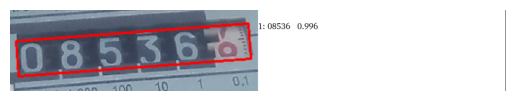


Processing cropped_134.jpg...
[2024/11/13 13:33:06] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.33699727058410645
[2024/11/13 13:33:06] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:06] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_134.jpg. Skipping...

Processing cropped_135.jpg...
[2024/11/13 13:33:07] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.48671555519104004
[2024/11/13 13:33:07] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:07] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_135.jpg. Skipping...

Processing cropped_136.jpg...
[2024/11/13 13:33:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.68611741065979
[2024/11/13 13:33:08] ppocr DEBUG: cls num  : 1, elapsed : 0.12966227531433105
[2024/11/13 13:33:08] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5066461563110352


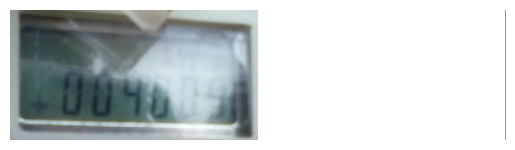


Processing cropped_137.jpg...
[2024/11/13 13:33:09] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.5883924961090088
[2024/11/13 13:33:09] ppocr DEBUG: cls num  : 2, elapsed : 0.13631010055541992
[2024/11/13 13:33:11] ppocr DEBUG: rec_res num  : 2, elapsed : 1.5827860832214355


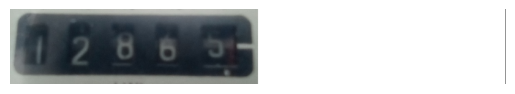


Processing cropped_138.jpg...
[2024/11/13 13:33:11] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.49851536750793457
[2024/11/13 13:33:11] ppocr DEBUG: cls num  : 2, elapsed : 0.023567676544189453
[2024/11/13 13:33:12] ppocr DEBUG: rec_res num  : 2, elapsed : 1.0799024105072021


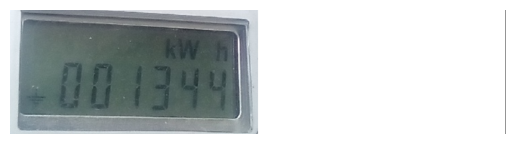


Processing cropped_139.jpg...
[2024/11/13 13:33:13] ppocr DEBUG: dt_boxes num : 4, elapsed : 0.6524899005889893
[2024/11/13 13:33:13] ppocr DEBUG: cls num  : 4, elapsed : 0.1577160358428955
[2024/11/13 13:33:16] ppocr DEBUG: rec_res num  : 4, elapsed : 2.437069892883301
Match found for '6223' in cropped_139.jpg.


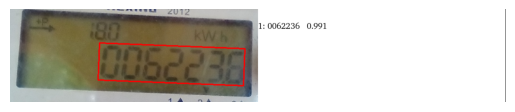


Processing cropped_140.jpg...
[2024/11/13 13:33:16] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.41840195655822754
[2024/11/13 13:33:16] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:16] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_140.jpg. Skipping...

Processing cropped_141.jpg...
[2024/11/13 13:33:17] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.4493446350097656
[2024/11/13 13:33:17] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:17] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_141.jpg. Skipping...

Processing cropped_142.jpg...
[2024/11/13 13:33:17] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.40225744247436523
[2024/11/13 13:33:17] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:17] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_142.jpg. Skipping...

Processing cropped_143.jpg...
[2024/11/13 13:33:18] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.30489492416381836
[2024/11/13 13

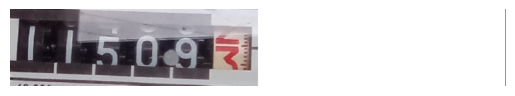


Processing cropped_145.jpg...
[2024/11/13 13:33:20] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.5598208904266357
[2024/11/13 13:33:20] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:20] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_145.jpg. Skipping...

Processing cropped_146.jpg...
[2024/11/13 13:33:21] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.7140140533447266
[2024/11/13 13:33:21] ppocr DEBUG: cls num  : 3, elapsed : 0.13354134559631348
[2024/11/13 13:33:23] ppocr DEBUG: rec_res num  : 3, elapsed : 2.0805952548980713


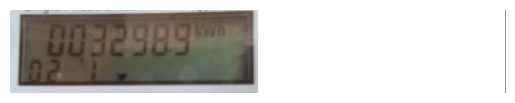


Processing cropped_147.jpg...
[2024/11/13 13:33:24] ppocr DEBUG: dt_boxes num : 4, elapsed : 0.4215562343597412
[2024/11/13 13:33:24] ppocr DEBUG: cls num  : 4, elapsed : 0.15018367767333984
[2024/11/13 13:33:26] ppocr DEBUG: rec_res num  : 4, elapsed : 2.3879737854003906


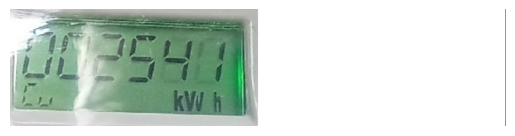


Processing cropped_148.jpg...
[2024/11/13 13:33:27] ppocr DEBUG: dt_boxes num : 5, elapsed : 0.5301339626312256
[2024/11/13 13:33:27] ppocr DEBUG: cls num  : 5, elapsed : 0.1568756103515625
[2024/11/13 13:33:31] ppocr DEBUG: rec_res num  : 5, elapsed : 4.124294996261597


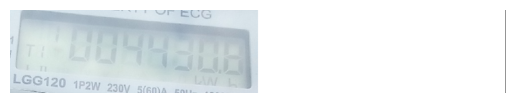


Processing cropped_149.jpg...
[2024/11/13 13:33:32] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.4395899772644043
[2024/11/13 13:33:32] ppocr DEBUG: cls num  : 2, elapsed : 0.13817667961120605
[2024/11/13 13:33:33] ppocr DEBUG: rec_res num  : 2, elapsed : 1.5455384254455566
Match found for '5236' in cropped_149.jpg.


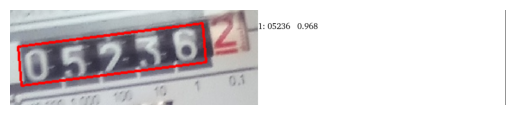


Processing cropped_15.jpg...
[2024/11/13 13:33:34] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.34218811988830566
[2024/11/13 13:33:34] ppocr DEBUG: cls num  : 1, elapsed : 0.12700533866882324
[2024/11/13 13:33:35] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5740597248077393
Match found for '3346' in cropped_15.jpg.


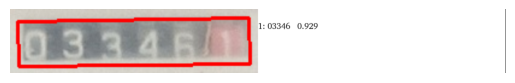


Processing cropped_150.jpg...
[2024/11/13 13:33:35] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.41394686698913574
[2024/11/13 13:33:35] ppocr DEBUG: cls num  : 1, elapsed : 0.01798844337463379
[2024/11/13 13:33:36] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4925506114959717


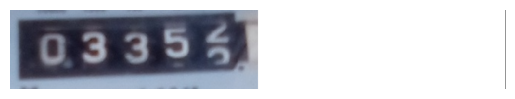


Processing cropped_151.jpg...
[2024/11/13 13:33:36] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.5921809673309326
[2024/11/13 13:33:36] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:36] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_151.jpg. Skipping...

Processing cropped_152.jpg...
[2024/11/13 13:33:37] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.7712001800537109
[2024/11/13 13:33:37] ppocr DEBUG: cls num  : 1, elapsed : 0.020589828491210938
[2024/11/13 13:33:37] ppocr DEBUG: rec_res num  : 1, elapsed : 0.36217713356018066
Match found for '7312' in cropped_152.jpg.


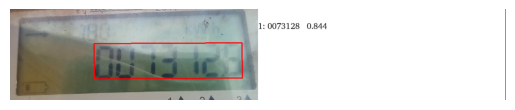


Processing cropped_153.jpg...
[2024/11/13 13:33:38] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.540869951248169
[2024/11/13 13:33:38] ppocr DEBUG: cls num  : 3, elapsed : 0.161590576171875
[2024/11/13 13:33:41] ppocr DEBUG: rec_res num  : 3, elapsed : 2.6424577236175537


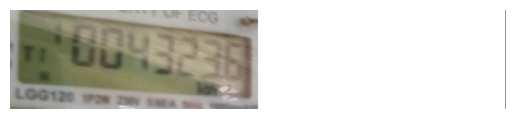


Processing cropped_154.jpg...
[2024/11/13 13:33:41] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.0743408203125
[2024/11/13 13:33:41] ppocr DEBUG: cls num  : 2, elapsed : 0.13599371910095215
[2024/11/13 13:33:43] ppocr DEBUG: rec_res num  : 2, elapsed : 1.6854474544525146


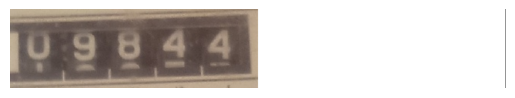


Processing cropped_155.jpg...
[2024/11/13 13:33:43] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.34935522079467773
[2024/11/13 13:33:43] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:43] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_155.jpg. Skipping...

Processing cropped_156.jpg...
[2024/11/13 13:33:44] ppocr DEBUG: dt_boxes num : 7, elapsed : 0.7058966159820557
[2024/11/13 13:33:44] ppocr DEBUG: cls num  : 7, elapsed : 0.23234033584594727
[2024/11/13 13:33:48] ppocr DEBUG: rec_res num  : 7, elapsed : 3.911608934402466


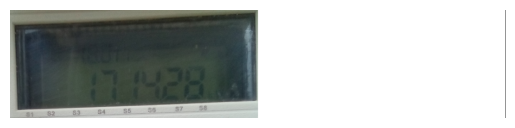


Processing cropped_157.jpg...
[2024/11/13 13:33:49] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.37021327018737793
[2024/11/13 13:33:49] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:49] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_157.jpg. Skipping...

Processing cropped_158.jpg...
[2024/11/13 13:33:49] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.47849440574645996
[2024/11/13 13:33:49] ppocr DEBUG: cls num  : 1, elapsed : 0.023986339569091797
[2024/11/13 13:33:50] ppocr DEBUG: rec_res num  : 1, elapsed : 0.39597177505493164
Match found for '1039' in cropped_158.jpg.


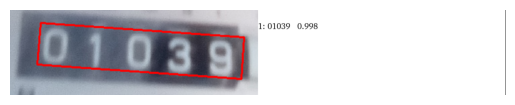


Processing cropped_159.jpg...
[2024/11/13 13:33:51] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.796001672744751
[2024/11/13 13:33:51] ppocr DEBUG: cls num  : 2, elapsed : 0.04860115051269531
[2024/11/13 13:33:52] ppocr DEBUG: rec_res num  : 2, elapsed : 1.133066177368164
Match found for '2441' in cropped_159.jpg.


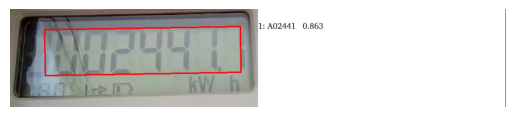


Processing cropped_16.jpg...
[2024/11/13 13:33:53] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.44480347633361816
[2024/11/13 13:33:53] ppocr DEBUG: cls num  : 1, elapsed : 0.018990039825439453
[2024/11/13 13:33:53] ppocr DEBUG: rec_res num  : 1, elapsed : 0.30381083488464355
Match found for '651' in cropped_16.jpg.


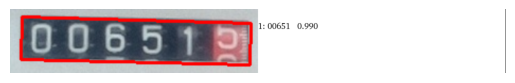


Processing cropped_160.jpg...
[2024/11/13 13:33:53] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.388965368270874
[2024/11/13 13:33:53] ppocr DEBUG: cls num  : 2, elapsed : 0.12490296363830566
[2024/11/13 13:33:55] ppocr DEBUG: rec_res num  : 2, elapsed : 1.1432149410247803


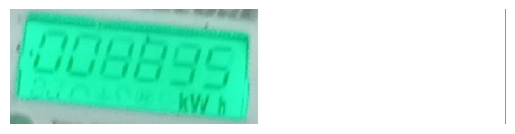


Processing cropped_161.jpg...
[2024/11/13 13:33:56] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.8791415691375732
[2024/11/13 13:33:56] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:56] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_161.jpg. Skipping...

Processing cropped_162.jpg...
[2024/11/13 13:33:56] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.467144250869751
[2024/11/13 13:33:56] ppocr DEBUG: cls num  : 1, elapsed : 0.11585783958435059
[2024/11/13 13:33:57] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4251832962036133
Match found for '4804' in cropped_162.jpg.


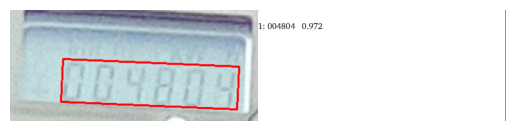


Processing cropped_163.jpg...
[2024/11/13 13:33:58] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.6674339771270752
[2024/11/13 13:33:58] ppocr DEBUG: cls num  : 1, elapsed : 0.025967836380004883
[2024/11/13 13:33:58] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5997874736785889


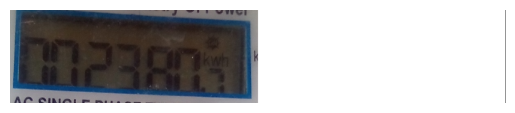


Processing cropped_164.jpg...
[2024/11/13 13:33:59] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.0689842700958252
[2024/11/13 13:33:59] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:33:59] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_164.jpg. Skipping...

Processing cropped_165.jpg...
[2024/11/13 13:33:59] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.44608402252197266
[2024/11/13 13:33:59] ppocr DEBUG: cls num  : 2, elapsed : 0.024163484573364258
[2024/11/13 13:34:01] ppocr DEBUG: rec_res num  : 2, elapsed : 2.0940091609954834
Match found for '389' in cropped_165.jpg.


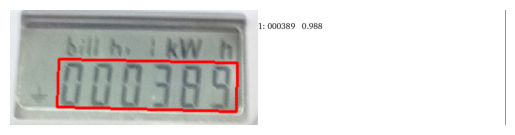


Processing cropped_166.jpg...
[2024/11/13 13:34:02] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.733633279800415
[2024/11/13 13:34:02] ppocr DEBUG: cls num  : 1, elapsed : 0.018990516662597656
[2024/11/13 13:34:02] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4114084243774414
Match found for '887' in cropped_166.jpg.


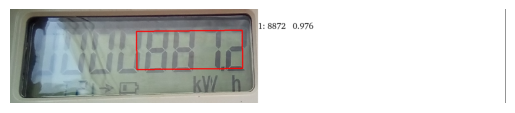


Processing cropped_167.jpg...
[2024/11/13 13:34:03] ppocr DEBUG: dt_boxes num : 7, elapsed : 0.7159268856048584
[2024/11/13 13:34:03] ppocr DEBUG: cls num  : 7, elapsed : 0.18448972702026367
[2024/11/13 13:34:07] ppocr DEBUG: rec_res num  : 7, elapsed : 3.8938803672790527


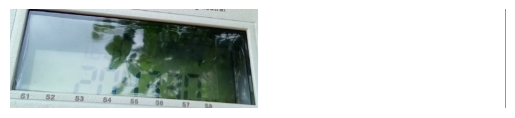


Processing cropped_168.jpg...
[2024/11/13 13:34:08] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.6826081275939941
[2024/11/13 13:34:08] ppocr DEBUG: cls num  : 2, elapsed : 0.1253523826599121
[2024/11/13 13:34:10] ppocr DEBUG: rec_res num  : 2, elapsed : 1.1950452327728271


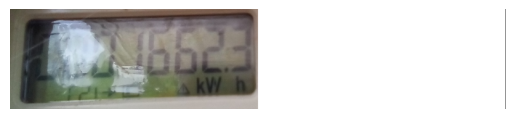


Processing cropped_169.jpg...
[2024/11/13 13:34:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.6060194969177246
[2024/11/13 13:34:11] ppocr DEBUG: cls num  : 1, elapsed : 0.12503337860107422
[2024/11/13 13:34:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4423959255218506


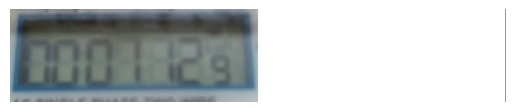


Processing cropped_17.jpg...
[2024/11/13 13:34:12] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.32915616035461426
[2024/11/13 13:34:12] ppocr DEBUG: cls num  : 1, elapsed : 0.017992019653320312
[2024/11/13 13:34:12] ppocr DEBUG: rec_res num  : 1, elapsed : 0.37972211837768555


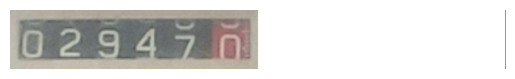


Processing cropped_170.jpg...
[2024/11/13 13:34:13] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.4465913772583008
[2024/11/13 13:34:13] ppocr DEBUG: cls num  : 1, elapsed : 0.021574735641479492
[2024/11/13 13:34:13] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3878648281097412
No text detected in cropped_170.jpg. Skipping...

Processing cropped_171.jpg...
[2024/11/13 13:34:14] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.7271347045898438
[2024/11/13 13:34:14] ppocr DEBUG: cls num  : 3, elapsed : 0.12039041519165039
[2024/11/13 13:34:16] ppocr DEBUG: rec_res num  : 3, elapsed : 2.1338043212890625


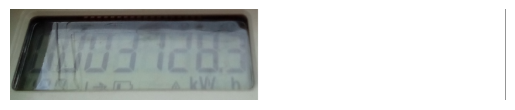


Processing cropped_172.jpg...
[2024/11/13 13:34:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5554389953613281
[2024/11/13 13:34:17] ppocr DEBUG: cls num  : 1, elapsed : 0.01898956298828125
[2024/11/13 13:34:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3301239013671875
Match found for '1883' in cropped_172.jpg.


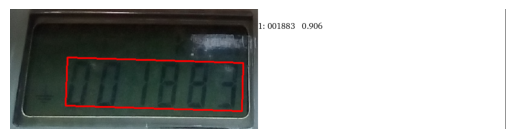


Processing cropped_173.jpg...
[2024/11/13 13:34:18] ppocr DEBUG: dt_boxes num : 6, elapsed : 0.5634665489196777
[2024/11/13 13:34:18] ppocr DEBUG: cls num  : 6, elapsed : 0.15732026100158691
[2024/11/13 13:34:22] ppocr DEBUG: rec_res num  : 6, elapsed : 3.504558563232422


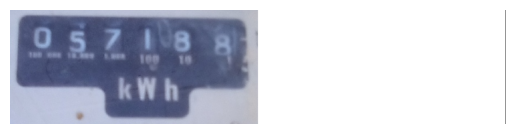


Processing cropped_174.jpg...
[2024/11/13 13:34:23] ppocr DEBUG: dt_boxes num : 4, elapsed : 0.8990678787231445
[2024/11/13 13:34:23] ppocr DEBUG: cls num  : 4, elapsed : 0.1510608196258545
[2024/11/13 13:34:25] ppocr DEBUG: rec_res num  : 4, elapsed : 2.471217393875122
Match found for '3984' in cropped_174.jpg.


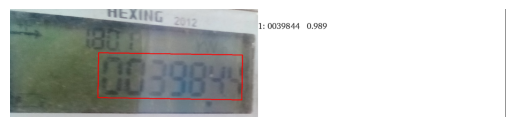


Processing cropped_175.jpg...
[2024/11/13 13:34:26] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.49028778076171875
[2024/11/13 13:34:26] ppocr DEBUG: cls num  : 2, elapsed : 0.1321275234222412
[2024/11/13 13:34:28] ppocr DEBUG: rec_res num  : 2, elapsed : 1.7625842094421387
Match found for '5915' in cropped_175.jpg.


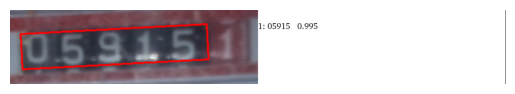


Processing cropped_176.jpg...
[2024/11/13 13:34:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5817570686340332
[2024/11/13 13:34:29] ppocr DEBUG: cls num  : 1, elapsed : 0.12889432907104492
[2024/11/13 13:34:29] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4694037437438965
Match found for '252' in cropped_176.jpg.


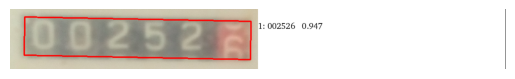


Processing cropped_177.jpg...
[2024/11/13 13:34:30] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.6790904998779297
[2024/11/13 13:34:30] ppocr DEBUG: cls num  : 1, elapsed : 0.019986867904663086
[2024/11/13 13:34:30] ppocr DEBUG: rec_res num  : 1, elapsed : 0.37410640716552734


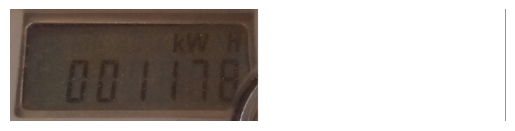


Processing cropped_178.jpg...
[2024/11/13 13:34:31] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.3724677562713623
[2024/11/13 13:34:31] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:34:31] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_178.jpg. Skipping...

Processing cropped_179.jpg...
[2024/11/13 13:34:31] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.34531450271606445
[2024/11/13 13:34:31] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:34:31] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_179.jpg. Skipping...

Processing cropped_18.jpg...
[2024/11/13 13:34:32] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.24972987174987793
[2024/11/13 13:34:32] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:34:32] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_18.jpg. Skipping...

Processing cropped_180.jpg...
[2024/11/13 13:34:32] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.04578757286071777
[2024/11/13 13:3

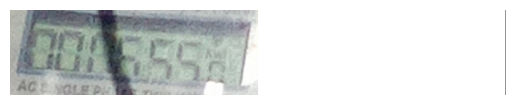


Processing cropped_186.jpg...
[2024/11/13 13:34:36] ppocr DEBUG: dt_boxes num : 5, elapsed : 0.6860697269439697
[2024/11/13 13:34:36] ppocr DEBUG: cls num  : 5, elapsed : 0.3238537311553955
[2024/11/13 13:34:42] ppocr DEBUG: rec_res num  : 5, elapsed : 5.223737716674805


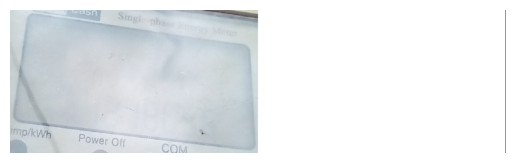


Processing cropped_187.jpg...
[2024/11/13 13:34:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.4205434322357178
[2024/11/13 13:34:42] ppocr DEBUG: cls num  : 1, elapsed : 0.021731853485107422
[2024/11/13 13:34:43] ppocr DEBUG: rec_res num  : 1, elapsed : 0.6091799736022949
Match found for '9418' in cropped_187.jpg.


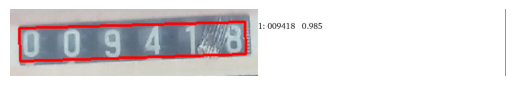


Processing cropped_188.jpg...
[2024/11/13 13:34:43] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5189602375030518
[2024/11/13 13:34:43] ppocr DEBUG: cls num  : 1, elapsed : 0.01866626739501953
[2024/11/13 13:34:44] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5107545852661133
No text detected in cropped_188.jpg. Skipping...

Processing cropped_189.jpg...
[2024/11/13 13:34:44] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.10904502868652344
[2024/11/13 13:34:44] ppocr DEBUG: cls num  : 1, elapsed : 0.02105569839477539
[2024/11/13 13:34:45] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3785586357116699


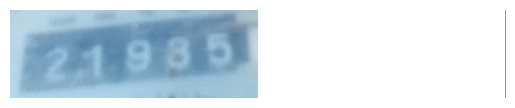


Processing cropped_19.jpg...
[2024/11/13 13:34:45] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5501739978790283
[2024/11/13 13:34:45] ppocr DEBUG: cls num  : 1, elapsed : 0.023986101150512695
[2024/11/13 13:34:46] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3548290729522705
Match found for '1963' in cropped_19.jpg.


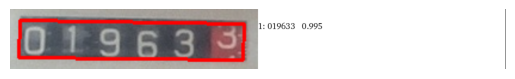


Processing cropped_190.jpg...
[2024/11/13 13:34:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.8925397396087646
[2024/11/13 13:34:47] ppocr DEBUG: cls num  : 1, elapsed : 0.12988734245300293
[2024/11/13 13:34:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3624401092529297


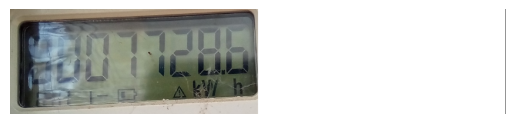


Processing cropped_191.jpg...
[2024/11/13 13:34:48] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.749337911605835
[2024/11/13 13:34:48] ppocr DEBUG: cls num  : 2, elapsed : 0.2469339370727539
[2024/11/13 13:34:50] ppocr DEBUG: rec_res num  : 2, elapsed : 1.6247916221618652
Match found for '2028' in cropped_191.jpg.


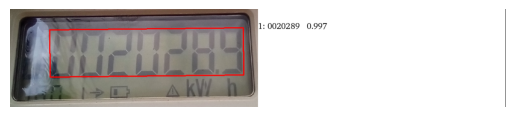


Processing cropped_192.jpg...
[2024/11/13 13:34:51] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5824799537658691
[2024/11/13 13:34:51] ppocr DEBUG: cls num  : 1, elapsed : 0.01788187026977539
[2024/11/13 13:34:51] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3808882236480713
No text detected in cropped_192.jpg. Skipping...

Processing cropped_193.jpg...
[2024/11/13 13:34:52] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.4256448745727539
[2024/11/13 13:34:52] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:34:52] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_193.jpg. Skipping...

Processing cropped_194.jpg...
[2024/11/13 13:34:52] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.7169525623321533
[2024/11/13 13:34:52] ppocr DEBUG: cls num  : 1, elapsed : 0.0179898738861084
[2024/11/13 13:34:53] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3102095127105713


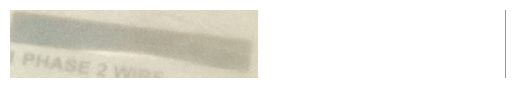


Processing cropped_195.jpg...
[2024/11/13 13:34:53] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.4751467704772949
[2024/11/13 13:34:53] ppocr DEBUG: cls num  : 1, elapsed : 0.01866745948791504
[2024/11/13 13:34:54] ppocr DEBUG: rec_res num  : 1, elapsed : 0.7465107440948486


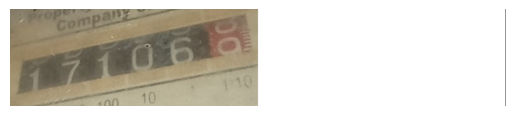


Processing cropped_196.jpg...
[2024/11/13 13:34:54] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.3109920024871826
[2024/11/13 13:34:54] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:34:54] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_196.jpg. Skipping...

Processing cropped_197.jpg...
[2024/11/13 13:34:55] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.5884687900543213
[2024/11/13 13:34:55] ppocr DEBUG: cls num  : 2, elapsed : 0.02498483657836914
[2024/11/13 13:34:57] ppocr DEBUG: rec_res num  : 2, elapsed : 1.8370590209960938
Match found for '1772' in cropped_197.jpg.


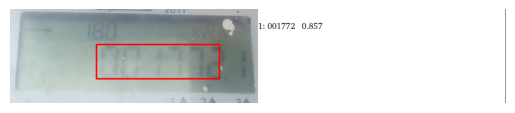


Processing cropped_198.jpg...
[2024/11/13 13:34:58] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.575934886932373
[2024/11/13 13:34:58] ppocr DEBUG: cls num  : 1, elapsed : 0.14113521575927734
[2024/11/13 13:34:58] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3543508052825928


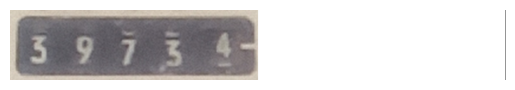


Processing cropped_199.jpg...
[2024/11/13 13:34:59] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.9682326316833496
[2024/11/13 13:34:59] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:34:59] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_199.jpg. Skipping...

Processing cropped_2.jpg...
[2024/11/13 13:35:00] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.552736759185791
[2024/11/13 13:35:00] ppocr DEBUG: cls num  : 2, elapsed : 0.1151583194732666
[2024/11/13 13:35:01] ppocr DEBUG: rec_res num  : 2, elapsed : 1.282940149307251
Match found for '4978' in cropped_2.jpg.


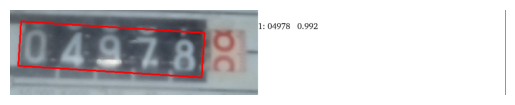


Processing cropped_20.jpg...
[2024/11/13 13:35:02] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.5250284671783447
[2024/11/13 13:35:02] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:35:02] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_20.jpg. Skipping...

Processing cropped_21.jpg...
[2024/11/13 13:35:02] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.3149383068084717
[2024/11/13 13:35:02] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:35:02] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_21.jpg. Skipping...

Processing cropped_22.jpg...
[2024/11/13 13:35:02] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.11382722854614258
[2024/11/13 13:35:02] ppocr DEBUG: cls num  : 1, elapsed : 0.019569873809814453
[2024/11/13 13:35:03] ppocr DEBUG: rec_res num  : 1, elapsed : 0.49784040451049805
Match found for '30665' in cropped_22.jpg.


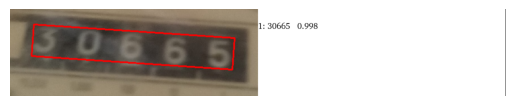


Processing cropped_23.jpg...
[2024/11/13 13:35:04] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.5195777416229248
[2024/11/13 13:35:04] ppocr DEBUG: cls num  : 3, elapsed : 0.14834809303283691
[2024/11/13 13:35:06] ppocr DEBUG: rec_res num  : 3, elapsed : 2.080897092819214
Match found for '212' in cropped_23.jpg.


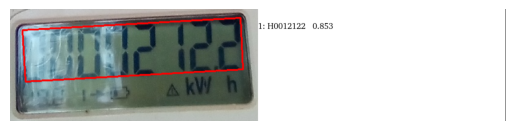


Processing cropped_24.jpg...
[2024/11/13 13:35:07] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.6823115348815918
[2024/11/13 13:35:07] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:35:07] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_24.jpg. Skipping...

Processing cropped_25.jpg...
[2024/11/13 13:35:07] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.4139084815979004
[2024/11/13 13:35:07] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:35:07] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_25.jpg. Skipping...

Processing cropped_26.jpg...
[2024/11/13 13:35:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.4974520206451416
[2024/11/13 13:35:08] ppocr DEBUG: cls num  : 1, elapsed : 0.11752676963806152
[2024/11/13 13:35:08] ppocr DEBUG: rec_res num  : 1, elapsed : 0.6255111694335938
Match found for '23384' in cropped_26.jpg.


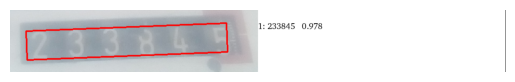


Processing cropped_27.jpg...
[2024/11/13 13:35:09] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.6418490409851074
[2024/11/13 13:35:09] ppocr DEBUG: cls num  : 1, elapsed : 0.01869678497314453
[2024/11/13 13:35:09] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4417431354522705


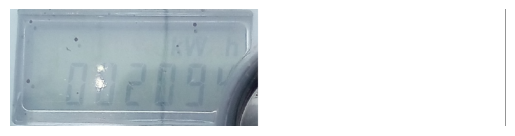


Processing cropped_28.jpg...
[2024/11/13 13:35:10] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.4346466064453125
[2024/11/13 13:35:10] ppocr DEBUG: cls num  : 1, elapsed : 0.018990039825439453
[2024/11/13 13:35:10] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4109323024749756


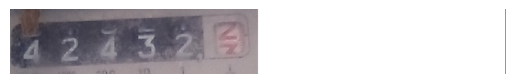


Processing cropped_29.jpg...
[2024/11/13 13:35:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5273149013519287
[2024/11/13 13:35:11] ppocr DEBUG: cls num  : 1, elapsed : 0.02027606964111328
[2024/11/13 13:35:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.36881089210510254
No text detected in cropped_29.jpg. Skipping...

Processing cropped_3.jpg...
[2024/11/13 13:35:12] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.3905489444732666
[2024/11/13 13:35:12] ppocr DEBUG: cls num  : 1, elapsed : 0.01752614974975586
[2024/11/13 13:35:12] ppocr DEBUG: rec_res num  : 1, elapsed : 0.3142061233520508
Match found for '2455' in cropped_3.jpg.


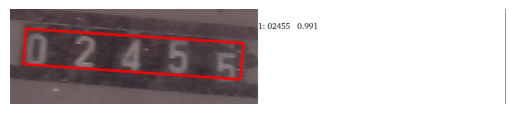


Processing cropped_30.jpg...
[2024/11/13 13:35:13] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.3714118003845215
[2024/11/13 13:35:13] ppocr DEBUG: cls num  : 1, elapsed : 0.019084453582763672
[2024/11/13 13:35:13] ppocr DEBUG: rec_res num  : 1, elapsed : 0.49622416496276855
Match found for '921' in cropped_30.jpg.


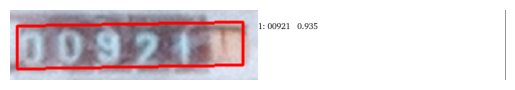


Processing cropped_31.jpg...
[2024/11/13 13:35:14] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.49251532554626465
[2024/11/13 13:35:14] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:35:14] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_31.jpg. Skipping...

Processing cropped_32.jpg...
[2024/11/13 13:35:14] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.6307144165039062
[2024/11/13 13:35:15] ppocr DEBUG: cls num  : 3, elapsed : 0.14038729667663574
[2024/11/13 13:35:17] ppocr DEBUG: rec_res num  : 3, elapsed : 2.307907819747925


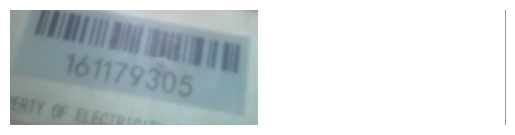


Processing cropped_33.jpg...
[2024/11/13 13:35:18] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.6283154487609863
[2024/11/13 13:35:18] ppocr DEBUG: cls num  : 1, elapsed : 0.13501811027526855
[2024/11/13 13:35:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.93839430809021


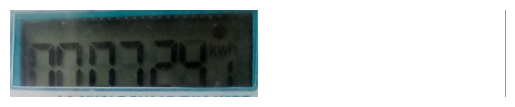


Processing cropped_34.jpg...
[2024/11/13 13:35:20] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.8272247314453125
[2024/11/13 13:35:20] ppocr DEBUG: cls num  : 1, elapsed : 0.018928050994873047
[2024/11/13 13:35:20] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5644233226776123


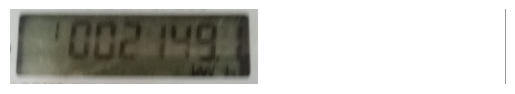


Processing cropped_35.jpg...
[2024/11/13 13:35:21] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.43637967109680176
[2024/11/13 13:35:21] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:35:21] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_35.jpg. Skipping...

Processing cropped_36.jpg...
[2024/11/13 13:35:22] ppocr DEBUG: dt_boxes num : 2, elapsed : 1.1299409866333008
[2024/11/13 13:35:22] ppocr DEBUG: cls num  : 2, elapsed : 0.13350129127502441
[2024/11/13 13:35:24] ppocr DEBUG: rec_res num  : 2, elapsed : 1.7651863098144531


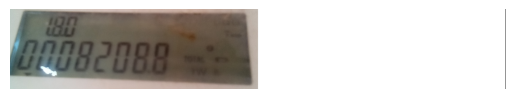


Processing cropped_37.jpg...
[2024/11/13 13:35:25] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.9053544998168945
[2024/11/13 13:35:25] ppocr DEBUG: cls num  : 2, elapsed : 0.03397536277770996
[2024/11/13 13:35:26] ppocr DEBUG: rec_res num  : 2, elapsed : 1.371373176574707


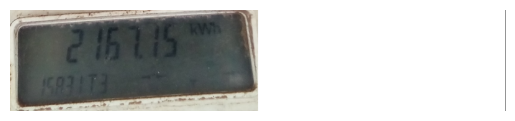


Processing cropped_38.jpg...
[2024/11/13 13:35:27] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.3579416275024414
[2024/11/13 13:35:27] ppocr DEBUG: cls num  : 3, elapsed : 0.15727543830871582
[2024/11/13 13:35:29] ppocr DEBUG: rec_res num  : 3, elapsed : 2.303311824798584


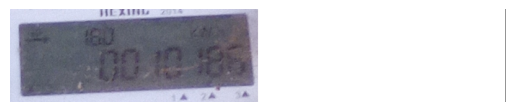


Processing cropped_39.jpg...
[2024/11/13 13:35:30] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.34778785705566406
[2024/11/13 13:35:30] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:35:30] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_39.jpg. Skipping...

Processing cropped_4.jpg...
[2024/11/13 13:35:31] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.8371303081512451
[2024/11/13 13:35:31] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:35:31] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_4.jpg. Skipping...

Processing cropped_40.jpg...
[2024/11/13 13:35:31] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.6107878684997559
[2024/11/13 13:35:32] ppocr DEBUG: cls num  : 1, elapsed : 0.13777685165405273
[2024/11/13 13:35:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.490222692489624
Match found for '7582' in cropped_40.jpg.


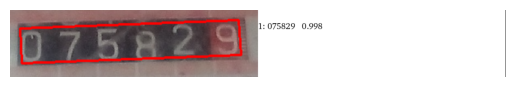


Processing cropped_41.jpg...
[2024/11/13 13:35:33] ppocr DEBUG: dt_boxes num : 4, elapsed : 1.2440721988677979
[2024/11/13 13:35:34] ppocr DEBUG: cls num  : 4, elapsed : 0.19437170028686523
[2024/11/13 13:35:36] ppocr DEBUG: rec_res num  : 4, elapsed : 2.743903875350952


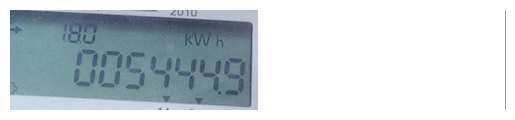


Processing cropped_42.jpg...
[2024/11/13 13:35:37] ppocr DEBUG: dt_boxes num : 5, elapsed : 0.4409456253051758
[2024/11/13 13:35:37] ppocr DEBUG: cls num  : 5, elapsed : 0.15942811965942383
[2024/11/13 13:35:41] ppocr DEBUG: rec_res num  : 5, elapsed : 3.4858245849609375


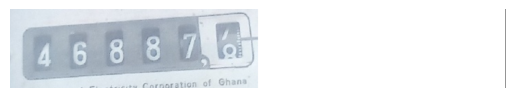


Processing cropped_43.jpg...
[2024/11/13 13:35:42] ppocr DEBUG: dt_boxes num : 4, elapsed : 1.2055566310882568
[2024/11/13 13:35:42] ppocr DEBUG: cls num  : 4, elapsed : 0.09667682647705078
[2024/11/13 13:35:45] ppocr DEBUG: rec_res num  : 4, elapsed : 2.871056079864502
Match found for '5703' in cropped_43.jpg.


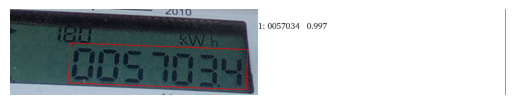


Processing cropped_44.jpg...
[2024/11/13 13:35:46] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.41517090797424316
[2024/11/13 13:35:46] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:35:46] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_44.jpg. Skipping...

Processing cropped_45.jpg...
[2024/11/13 13:35:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.9488444328308105
[2024/11/13 13:35:47] ppocr DEBUG: cls num  : 1, elapsed : 0.3073270320892334
[2024/11/13 13:35:48] ppocr DEBUG: rec_res num  : 1, elapsed : 0.591090202331543


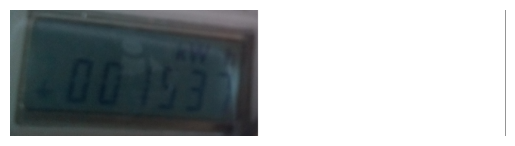


Processing cropped_46.jpg...
[2024/11/13 13:35:49] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.8373935222625732
[2024/11/13 13:35:49] ppocr DEBUG: cls num  : 1, elapsed : 0.06840896606445312
[2024/11/13 13:35:49] ppocr DEBUG: rec_res num  : 1, elapsed : 0.6102018356323242


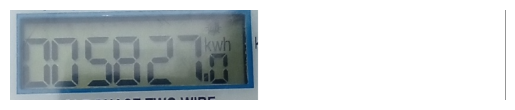


Processing cropped_47.jpg...
[2024/11/13 13:35:51] ppocr DEBUG: dt_boxes num : 0, elapsed : 1.28169846534729
[2024/11/13 13:35:51] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:35:51] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_47.jpg. Skipping...

Processing cropped_48.jpg...
[2024/11/13 13:35:52] ppocr DEBUG: dt_boxes num : 2, elapsed : 1.0417747497558594
[2024/11/13 13:35:52] ppocr DEBUG: cls num  : 2, elapsed : 0.1281290054321289
[2024/11/13 13:35:54] ppocr DEBUG: rec_res num  : 2, elapsed : 1.6980669498443604


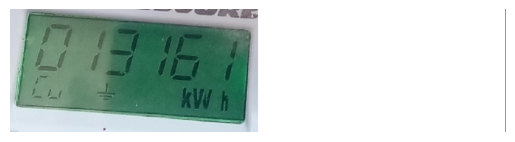


Processing cropped_49.jpg...
[2024/11/13 13:35:55] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.828803300857544
[2024/11/13 13:35:55] ppocr DEBUG: cls num  : 1, elapsed : 0.16588068008422852
[2024/11/13 13:35:55] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5965778827667236
No text detected in cropped_49.jpg. Skipping...

Processing cropped_5.jpg...
[2024/11/13 13:35:57] ppocr DEBUG: dt_boxes num : 1, elapsed : 1.6754169464111328
[2024/11/13 13:35:57] ppocr DEBUG: cls num  : 1, elapsed : 0.23401379585266113
[2024/11/13 13:35:58] ppocr DEBUG: rec_res num  : 1, elapsed : 0.45296764373779297
No text detected in cropped_5.jpg. Skipping...

Processing cropped_50.jpg...
[2024/11/13 13:35:58] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.3803384304046631
[2024/11/13 13:35:58] ppocr DEBUG: cls num  : 1, elapsed : 0.01898813247680664
[2024/11/13 13:35:59] ppocr DEBUG: rec_res num  : 1, elapsed : 0.47373270988464355


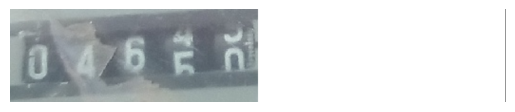


Processing cropped_52.jpg...
[2024/11/13 13:36:00] ppocr DEBUG: dt_boxes num : 9, elapsed : 0.9150712490081787
[2024/11/13 13:36:00] ppocr DEBUG: cls num  : 9, elapsed : 0.32270169258117676
[2024/11/13 13:36:06] ppocr DEBUG: rec_res num  : 9, elapsed : 6.406764268875122


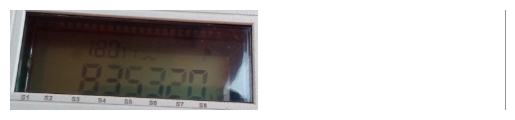


Processing cropped_53.jpg...
[2024/11/13 13:36:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.9054856300354004
[2024/11/13 13:36:07] ppocr DEBUG: cls num  : 1, elapsed : 0.018988609313964844
[2024/11/13 13:36:08] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4394364356994629


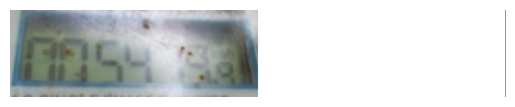


Processing cropped_54.jpg...
[2024/11/13 13:36:10] ppocr DEBUG: dt_boxes num : 3, elapsed : 1.8858954906463623
[2024/11/13 13:36:10] ppocr DEBUG: cls num  : 3, elapsed : 0.06872153282165527
[2024/11/13 13:36:12] ppocr DEBUG: rec_res num  : 3, elapsed : 2.3721628189086914


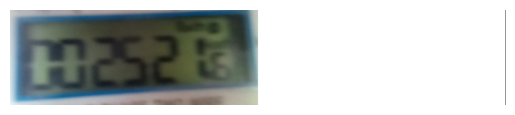


Processing cropped_55.jpg...
[2024/11/13 13:36:13] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.6050305366516113
[2024/11/13 13:36:13] ppocr DEBUG: cls num  : 1, elapsed : 0.15789294242858887
[2024/11/13 13:36:14] ppocr DEBUG: rec_res num  : 1, elapsed : 0.6288068294525146
Match found for '14527' in cropped_55.jpg.


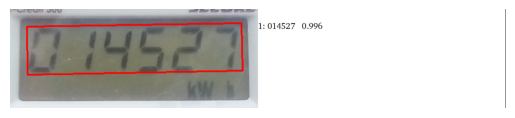


Processing cropped_56.jpg...
[2024/11/13 13:36:15] ppocr DEBUG: dt_boxes num : 4, elapsed : 0.903317928314209
[2024/11/13 13:36:15] ppocr DEBUG: cls num  : 4, elapsed : 0.1656785011291504
[2024/11/13 13:36:18] ppocr DEBUG: rec_res num  : 4, elapsed : 3.179877996444702
Match found for '4666' in cropped_56.jpg.


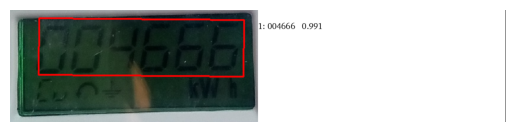


Processing cropped_57.jpg...
[2024/11/13 13:36:19] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.7066226005554199
[2024/11/13 13:36:20] ppocr DEBUG: cls num  : 2, elapsed : 0.37401795387268066
[2024/11/13 13:36:22] ppocr DEBUG: rec_res num  : 2, elapsed : 2.141697645187378


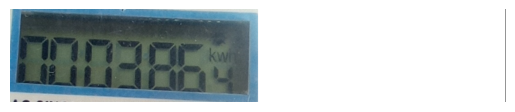


Processing cropped_58.jpg...
[2024/11/13 13:36:22] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.42765164375305176
[2024/11/13 13:36:22] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:22] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_58.jpg. Skipping...

Processing cropped_61.jpg...
[2024/11/13 13:36:23] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.8474998474121094
[2024/11/13 13:36:23] ppocr DEBUG: cls num  : 2, elapsed : 0.02699565887451172
[2024/11/13 13:36:24] ppocr DEBUG: rec_res num  : 2, elapsed : 1.3162665367126465


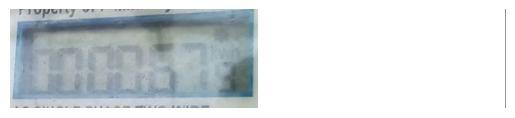


Processing cropped_62.jpg...
[2024/11/13 13:36:25] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5158731937408447
[2024/11/13 13:36:26] ppocr DEBUG: cls num  : 1, elapsed : 0.386232852935791
[2024/11/13 13:36:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.6887900829315186
No text detected in cropped_62.jpg. Skipping...

Processing cropped_63.jpg...
[2024/11/13 13:36:27] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.43398427963256836
[2024/11/13 13:36:27] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:27] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_63.jpg. Skipping...

Processing cropped_64.jpg...
[2024/11/13 13:36:27] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.6400353908538818
[2024/11/13 13:36:27] ppocr DEBUG: cls num  : 2, elapsed : 0.025562286376953125
[2024/11/13 13:36:29] ppocr DEBUG: rec_res num  : 2, elapsed : 1.898280143737793


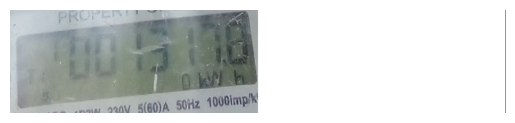


Processing cropped_65.jpg...
[2024/11/13 13:36:30] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5258359909057617
[2024/11/13 13:36:30] ppocr DEBUG: cls num  : 1, elapsed : 0.0199887752532959
[2024/11/13 13:36:31] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5231509208679199
Match found for '4374' in cropped_65.jpg.


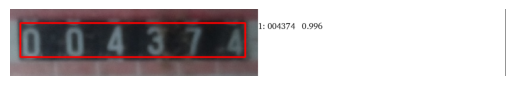


Processing cropped_66.jpg...
[2024/11/13 13:36:31] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5211164951324463
[2024/11/13 13:36:31] ppocr DEBUG: cls num  : 1, elapsed : 0.02098870277404785
[2024/11/13 13:36:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4233067035675049
Match found for '1909' in cropped_66.jpg.


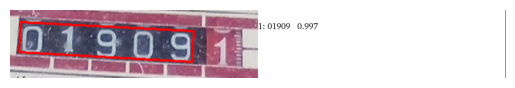


Processing cropped_67.jpg...
[2024/11/13 13:36:33] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.8305082321166992
[2024/11/13 13:36:33] ppocr DEBUG: cls num  : 1, elapsed : 0.01864314079284668
[2024/11/13 13:36:33] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4466221332550049
Match found for '3841' in cropped_67.jpg.


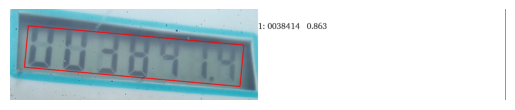


Processing cropped_68.jpg...
[2024/11/13 13:36:34] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5633187294006348
[2024/11/13 13:36:34] ppocr DEBUG: cls num  : 1, elapsed : 0.02698540687561035
[2024/11/13 13:36:34] ppocr DEBUG: rec_res num  : 1, elapsed : 0.39649438858032227
Match found for '87' in cropped_68.jpg.


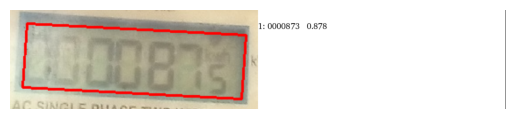


Processing cropped_69.jpg...
[2024/11/13 13:36:35] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5114099979400635
[2024/11/13 13:36:35] ppocr DEBUG: cls num  : 1, elapsed : 0.019989728927612305
[2024/11/13 13:36:35] ppocr DEBUG: rec_res num  : 1, elapsed : 0.44219112396240234


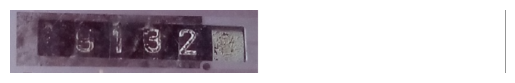


Processing cropped_7.jpg...
[2024/11/13 13:36:37] ppocr DEBUG: dt_boxes num : 0, elapsed : 1.2900662422180176
[2024/11/13 13:36:37] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:37] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_7.jpg. Skipping...

Processing cropped_70.jpg...
[2024/11/13 13:36:37] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.7609522342681885
[2024/11/13 13:36:37] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:37] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_70.jpg. Skipping...

Processing cropped_71.jpg...
[2024/11/13 13:36:38] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5358316898345947
[2024/11/13 13:36:38] ppocr DEBUG: cls num  : 1, elapsed : 0.12717604637145996
[2024/11/13 13:36:39] ppocr DEBUG: rec_res num  : 1, elapsed : 0.6248071193695068
Match found for '13033' in cropped_71.jpg.


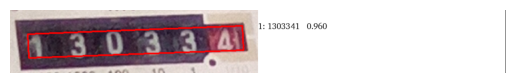


Processing cropped_72.jpg...
[2024/11/13 13:36:39] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.4285881519317627
[2024/11/13 13:36:39] ppocr DEBUG: cls num  : 1, elapsed : 0.01898813247680664
[2024/11/13 13:36:40] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5702621936798096


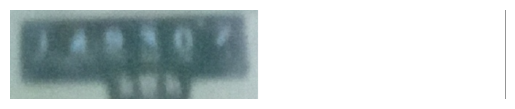


Processing cropped_73.jpg...
[2024/11/13 13:36:40] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.11497950553894043
[2024/11/13 13:36:40] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:40] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_73.jpg. Skipping...

Processing cropped_74.jpg...
[2024/11/13 13:36:41] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.3364219665527344
[2024/11/13 13:36:41] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:41] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_74.jpg. Skipping...

Processing cropped_75.jpg...
[2024/11/13 13:36:41] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.5589001178741455
[2024/11/13 13:36:41] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:41] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_75.jpg. Skipping...

Processing cropped_76.jpg...
[2024/11/13 13:36:41] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.2645132541656494
[2024/11/13 13:36:41] p

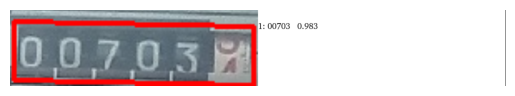


Processing cropped_77.jpg...
[2024/11/13 13:36:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027985334396362305
[2024/11/13 13:36:42] ppocr DEBUG: cls num  : 1, elapsed : 0.04027056694030762
[2024/11/13 13:36:42] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5840127468109131
Match found for '15378' in cropped_77.jpg.


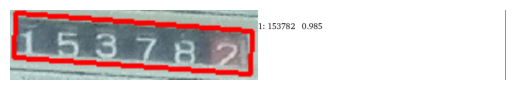


Processing cropped_78.jpg...
[2024/11/13 13:36:43] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.6712868213653564
[2024/11/13 13:36:44] ppocr DEBUG: cls num  : 2, elapsed : 0.2703735828399658
[2024/11/13 13:36:45] ppocr DEBUG: rec_res num  : 2, elapsed : 1.3690106868743896


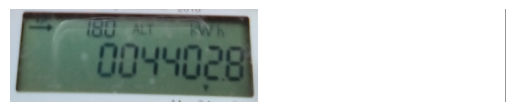


Processing cropped_79.jpg...
[2024/11/13 13:36:46] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.5576438903808594
[2024/11/13 13:36:46] ppocr DEBUG: cls num  : 2, elapsed : 0.02445387840270996
[2024/11/13 13:36:47] ppocr DEBUG: rec_res num  : 2, elapsed : 1.1466038227081299
Match found for '1357' in cropped_79.jpg.


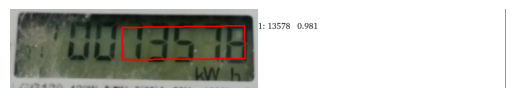


Processing cropped_8.jpg...
[2024/11/13 13:36:48] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.5206892490386963
[2024/11/13 13:36:48] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:48] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_8.jpg. Skipping...

Processing cropped_80.jpg...
[2024/11/13 13:36:48] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.40500593185424805
[2024/11/13 13:36:48] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:48] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_80.jpg. Skipping...

Processing cropped_81.jpg...
[2024/11/13 13:36:49] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.6340203285217285
[2024/11/13 13:36:49] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:49] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_81.jpg. Skipping...

Processing cropped_82.jpg...
[2024/11/13 13:36:49] ppocr DEBUG: dt_boxes num : 7, elapsed : 0.6754961013793945
[2024/11/13 13:36:50] ppo

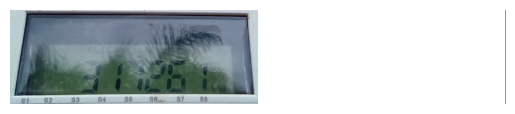


Processing cropped_83.jpg...
[2024/11/13 13:36:54] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.5101664066314697
[2024/11/13 13:36:54] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:54] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_83.jpg. Skipping...

Processing cropped_84.jpg...
[2024/11/13 13:36:55] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.4833033084869385
[2024/11/13 13:36:55] ppocr DEBUG: cls num  : 1, elapsed : 0.01955246925354004
[2024/11/13 13:36:55] ppocr DEBUG: rec_res num  : 1, elapsed : 0.6116518974304199
Match found for '34527' in cropped_84.jpg.


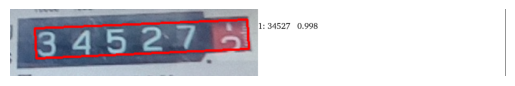


Processing cropped_86.jpg...
[2024/11/13 13:36:56] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5833258628845215
[2024/11/13 13:36:56] ppocr DEBUG: cls num  : 1, elapsed : 0.01887369155883789
[2024/11/13 13:36:57] ppocr DEBUG: rec_res num  : 1, elapsed : 0.6473846435546875
Match found for '3956' in cropped_86.jpg.


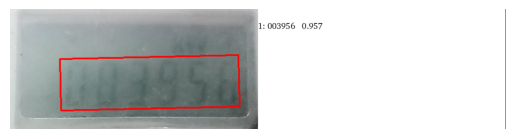


Processing cropped_87.jpg...
[2024/11/13 13:36:57] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.38935089111328125
[2024/11/13 13:36:57] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:57] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_87.jpg. Skipping...

Processing cropped_88.jpg...
[2024/11/13 13:36:58] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.5128679275512695
[2024/11/13 13:36:58] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:36:58] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_88.jpg. Skipping...

Processing cropped_89.jpg...
[2024/11/13 13:36:59] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.6915309429168701
[2024/11/13 13:36:59] ppocr DEBUG: cls num  : 3, elapsed : 0.13933682441711426
[2024/11/13 13:37:02] ppocr DEBUG: rec_res num  : 3, elapsed : 2.91786789894104


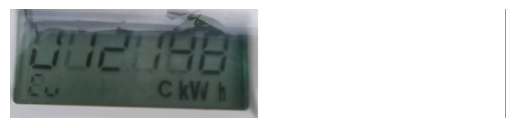


Processing cropped_9.jpg...
[2024/11/13 13:37:03] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.9414892196655273
[2024/11/13 13:37:03] ppocr DEBUG: cls num  : 1, elapsed : 0.13817334175109863
[2024/11/13 13:37:03] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5328969955444336
Match found for '3829' in cropped_9.jpg.


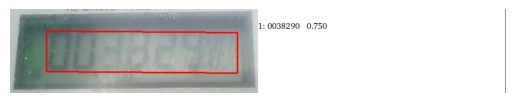


Processing cropped_90.jpg...
[2024/11/13 13:37:04] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.8054742813110352
[2024/11/13 13:37:04] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:37:04] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_90.jpg. Skipping...

Processing cropped_91.jpg...
[2024/11/13 13:37:05] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.4126248359680176
[2024/11/13 13:37:05] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/11/13 13:37:05] ppocr DEBUG: rec_res num  : 0, elapsed : 0.0
No text detected in cropped_91.jpg. Skipping...

Processing cropped_92.jpg...
[2024/11/13 13:37:05] ppocr DEBUG: dt_boxes num : 4, elapsed : 0.6614596843719482
[2024/11/13 13:37:06] ppocr DEBUG: cls num  : 4, elapsed : 0.1305408477783203
[2024/11/13 13:37:09] ppocr DEBUG: rec_res num  : 4, elapsed : 2.924071788787842


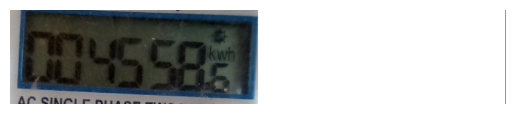


Processing cropped_93.jpg...
[2024/11/13 13:37:09] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.6023297309875488
[2024/11/13 13:37:09] ppocr DEBUG: cls num  : 1, elapsed : 0.018989086151123047
[2024/11/13 13:37:10] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5643510818481445


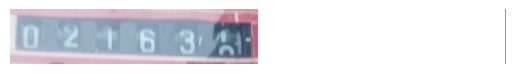


Processing cropped_94.jpg...
[2024/11/13 13:37:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.6119592189788818
[2024/11/13 13:37:11] ppocr DEBUG: cls num  : 1, elapsed : 0.0219876766204834
[2024/11/13 13:37:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.47460103034973145
Match found for '7189' in cropped_94.jpg.


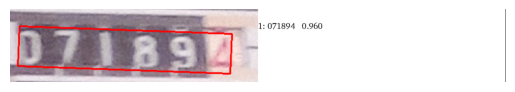


Processing cropped_95.jpg...
[2024/11/13 13:37:13] ppocr DEBUG: dt_boxes num : 3, elapsed : 1.65342116355896
[2024/11/13 13:37:13] ppocr DEBUG: cls num  : 3, elapsed : 0.1340029239654541
[2024/11/13 13:37:16] ppocr DEBUG: rec_res num  : 3, elapsed : 2.4331889152526855
Match found for '20605' in cropped_95.jpg.


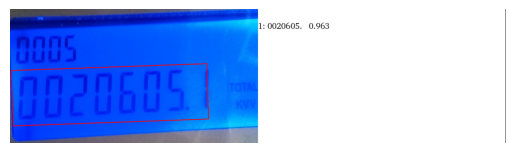


Processing cropped_96.jpg...
[2024/11/13 13:37:16] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5994057655334473
[2024/11/13 13:37:16] ppocr DEBUG: cls num  : 1, elapsed : 0.1421337127685547
[2024/11/13 13:37:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.5291748046875


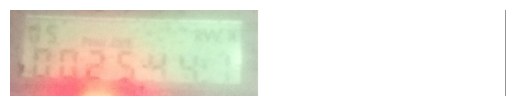


Processing cropped_97.jpg...
[2024/11/13 13:37:18] ppocr DEBUG: dt_boxes num : 4, elapsed : 0.6699519157409668
[2024/11/13 13:37:18] ppocr DEBUG: cls num  : 4, elapsed : 0.37108349800109863
[2024/11/13 13:37:21] ppocr DEBUG: rec_res num  : 4, elapsed : 3.0407848358154297


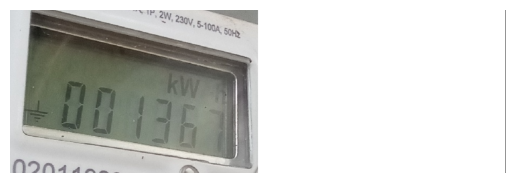


Processing cropped_98.jpg...
[2024/11/13 13:37:22] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.5801701545715332
[2024/11/13 13:37:22] ppocr DEBUG: cls num  : 1, elapsed : 0.019988298416137695
[2024/11/13 13:37:23] ppocr DEBUG: rec_res num  : 1, elapsed : 0.429506778717041
Match found for '31320' in cropped_98.jpg.


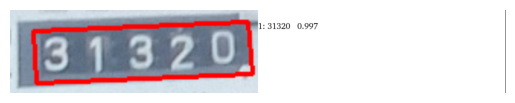


Updated CSV saved to: .\Updated_Readings3.csv

Total images: 200
Matched images: 61
Accuracy: 30.50%


In [43]:
import os
import cv2
import matplotlib.pyplot as plt

font_path = 'C:/Users/Sasa/Desktop/data/PaddleOCR/doc/fonts/latin.ttf'
images_folder = './cropped_dir'
csv_file = './Readings1.csv'

output_csv = process_images(images_folder, font_path, csv_file)
check_accuracy(output_csv)

In [44]:
new_df = pd.read_csv('./Updated_Readings3.csv')

In [18]:
import cv2
import numpy as np

def preprocess_image(image_path):
    # Load image
    image = cv2.imread(image_path)
    
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Remove noise
    denoised_image = cv2.medianBlur(gray_image, 3)
    
    # Apply thresholding
    _, binary_image = cv2.threshold(denoised_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Dilation and erosion
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1))
    dilated_image = cv2.dilate(binary_image, kernel, iterations=1)
    eroded_image = cv2.erode(dilated_image, kernel, iterations=1)
    
    return denoised_image

# Example usage
preprocessed_image = preprocess_image('../cropped_dir2/cropped_0.jpg')
cv2.imshow('Preprocessed Image', preprocessed_image)
cv2.waitKey(0)
cv2.destroyAllWindows()